# Basic EDA & Data Pre-processing

In [2]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from scipy.stats import multivariate_normal
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

warnings.filterwarnings("ignore")

%matplotlib inline 
%config InlineBackend.figure_format = 'retina'

plt.style.use("seaborn-v0_8")

pd.set_option('display.float_format', lambda x: '%.3f' % x)

# Load the dataset
df = pd.read_csv('Customer-Churn-Records 2025.csv')
df.shape

(10000, 18)

In [3]:
# Display the first few rows of the dataset
print("First few rows of the dataset:")
print(df.head())

First few rows of the dataset:
   RowNumber  CustomerId   Surname  CreditScore Geography  Gender  Age  \
0          1    15634602  Hargrave          619       NSW  Female   42   
1          2    15647311      Hill          608       QLD  Female   41   
2          3    15619304      Onio          502       NSW  Female   42   
3          4    15701354      Boni          699       NSW  Female   39   
4          5    15737888  Mitchell          850       QLD  Female   43   

   Tenure    Balance  NumOfProducts  HasCrCard  IsActiveMember  \
0       2      0.000              1          1               1   
1       1  83807.860              1          0               1   
2       8 159660.800              3          1               0   
3       1      0.000              2          0               0   
4       2 125510.820              1          1               1   

   EstimatedSalary  Exited  Complain  Satisfaction Score Card Type  \
0       101348.880       1         1                   2 

In [4]:
# MUST convert column names to lower case for the sorting to work!
df.columns = [col.lower() for col in df.columns]
list(df.columns)

['rownumber',
 'customerid',
 'surname',
 'creditscore',
 'geography',
 'gender',
 'age',
 'tenure',
 'balance',
 'numofproducts',
 'hascrcard',
 'isactivemember',
 'estimatedsalary',
 'exited',
 'complain',
 'satisfaction score',
 'card type',
 'point earned']

In [5]:
# Display basic information about the dataset
print("\nBasic information about the dataset:")
print(df.info())


Basic information about the dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 18 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   rownumber           10000 non-null  int64  
 1   customerid          10000 non-null  int64  
 2   surname             10000 non-null  object 
 3   creditscore         10000 non-null  int64  
 4   geography           10000 non-null  object 
 5   gender              10000 non-null  object 
 6   age                 10000 non-null  int64  
 7   tenure              10000 non-null  int64  
 8   balance             10000 non-null  float64
 9   numofproducts       10000 non-null  int64  
 10  hascrcard           10000 non-null  int64  
 11  isactivemember      10000 non-null  int64  
 12  estimatedsalary     10000 non-null  float64
 13  exited              10000 non-null  int64  
 14  complain            10000 non-null  int64  
 15  satisfaction sco

In [6]:
# Display summary statistics of the dataset
print("\nSummary statistics of the dataset:")
print(df.describe())


Summary statistics of the dataset:
       rownumber   customerid  creditscore       age    tenure    balance  \
count  10000.000    10000.000    10000.000 10000.000 10000.000  10000.000   
mean    5000.500 15690940.569      650.529    38.922     5.013  76485.889   
std     2886.896    71936.186       96.653    10.488     2.892  62397.405   
min        1.000 15565701.000      350.000    18.000     0.000      0.000   
25%     2500.750 15628528.250      584.000    32.000     3.000      0.000   
50%     5000.500 15690738.000      652.000    37.000     5.000  97198.540   
75%     7500.250 15753233.750      718.000    44.000     7.000 127644.240   
max    10000.000 15815690.000      850.000    92.000    10.000 250898.090   

       numofproducts  hascrcard  isactivemember  estimatedsalary    exited  \
count      10000.000  10000.000       10000.000        10000.000 10000.000   
mean           1.530      0.706           0.515       100090.240     0.204   
std            0.582      0.456     

In [7]:
# Check for missing values
print("\nMissing values in the dataset:")
print(df.isnull().sum())


Missing values in the dataset:
rownumber             0
customerid            0
surname               0
creditscore           0
geography             0
gender                0
age                   0
tenure                0
balance               0
numofproducts         0
hascrcard             0
isactivemember        0
estimatedsalary       0
exited                0
complain              0
satisfaction score    0
card type             0
point earned          0
dtype: int64


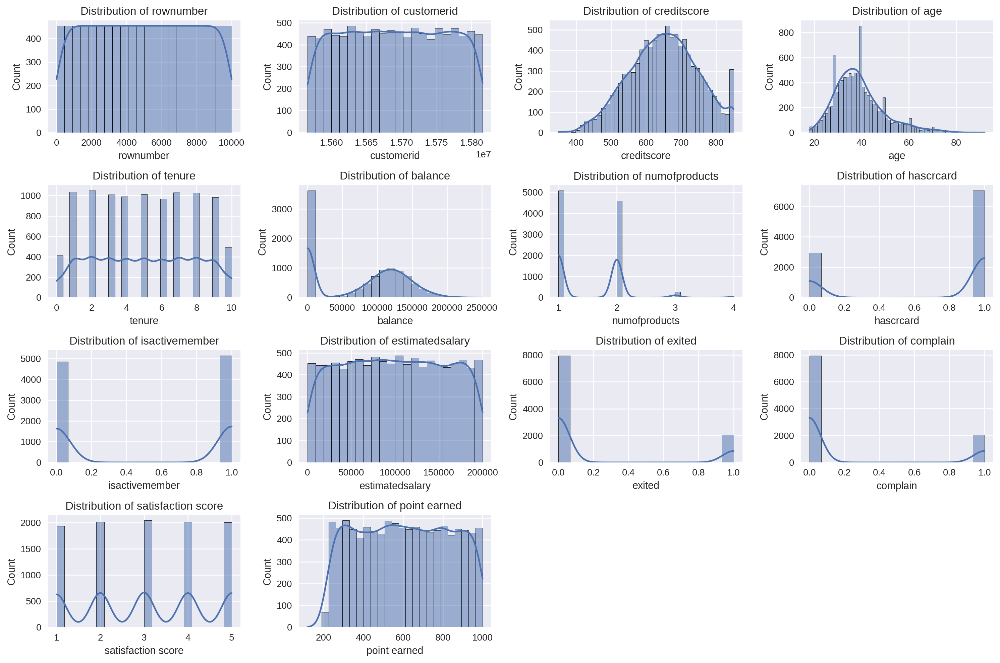

In [8]:
# Visualize the distribution of numerical features
numerical_features = df.select_dtypes(include=[np.number]).columns.tolist()
plt.figure(figsize=(15, 10))
for i, feature in enumerate(numerical_features):
    plt.subplot(4, 4, i+1)
    sns.histplot(df[feature], kde=True)
    plt.title(f'Distribution of {feature}')
plt.tight_layout()
plt.show()

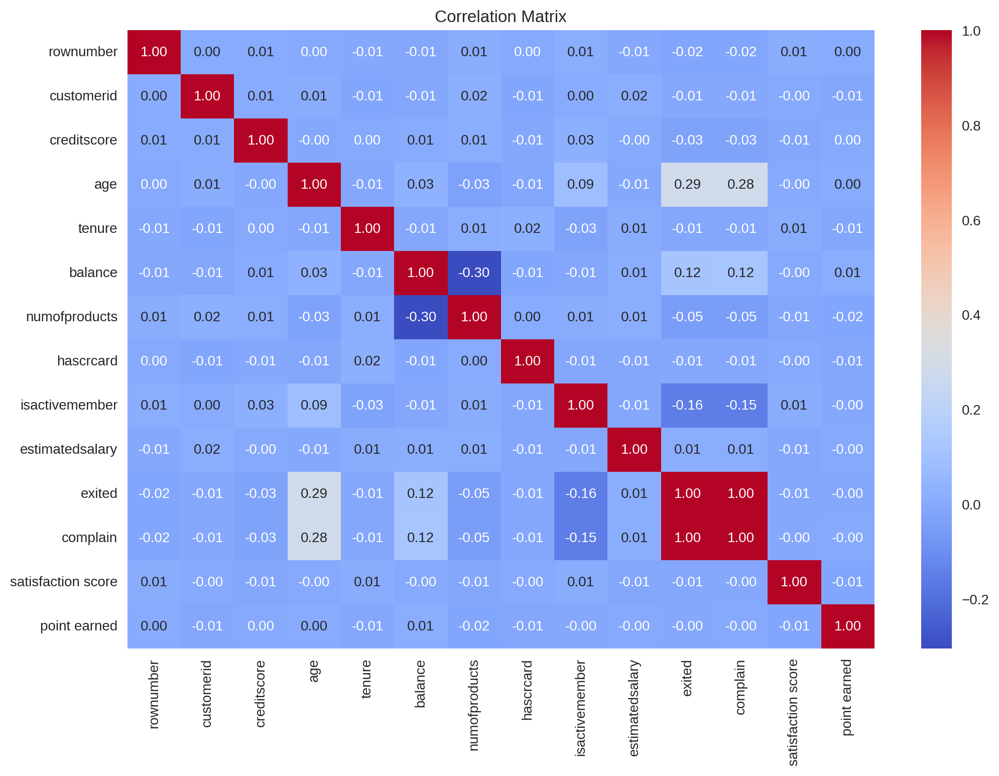

In [9]:
# Visualize the correlation matrix
plt.figure(figsize=(12, 8))
correlation_matrix = df.corr(numeric_only=True)
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

**The correlation between the Complain and Exited variables in the dataset is indeed very high, with a correlation coefficient of approximately 0.99. This strong correlation indicates that customers who have filed complaints are highly likely to exit, which can significantly impact the model's performance .Need to Exclude this from he model training

Drop columns that are not needed for prediction and the 'Complain' column to reduce multicollinearity

Logistic Regression - ROC/AUC: 0.7783773598648407, Precision: 0.5524475524475524, Recall: 0.2010178117048346, F1 Score: 0.2947761194029851
DT- ROC/AUC: 0.6854078292964464, Precision: 0.4707259953161593, Recall: 0.5114503816793893, F1 Score: 0.4902439024390244
Random Forest - ROC/AUC: 0.854163796748006, Precision: 0.768595041322314, Recall: 0.4732824427480916, F1 Score: 0.5858267716535434
Gradient Boosting - ROC/AUC: 0.8702234657216916, Precision: 0.7411764705882353, Recall: 0.48091603053435117, F1 Score: 0.5833333333333334
Logistic Regression - Training Accuracy: 0.811, Testing Accuracy: 0.811
DT - Training Accuracy: 1.0, Testing Accuracy: 0.791
Random Forest - Training Accuracy: 1.0, Testing Accuracy: 0.8685
Gradient Boosting - Training Accuracy: 0.873625, Testing Accuracy: 0.865
Logistic Regression - Data Leakage Check: No significant data leakage detected
DT - Data Leakage Check: Possible data leakage detected
Random Forest - Data Leakage Check: Possible data leakage detected
Gradie

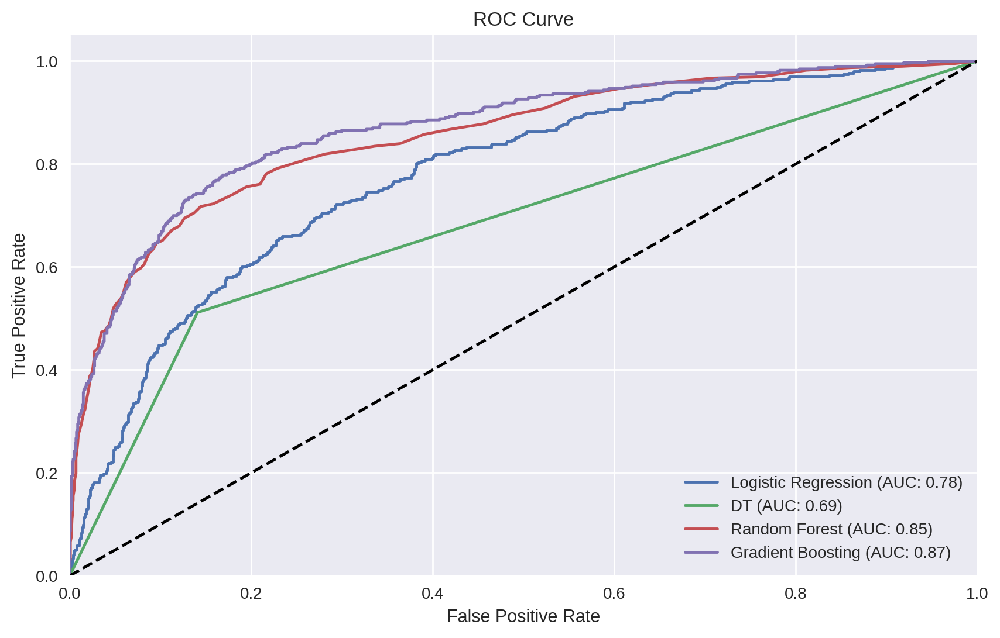

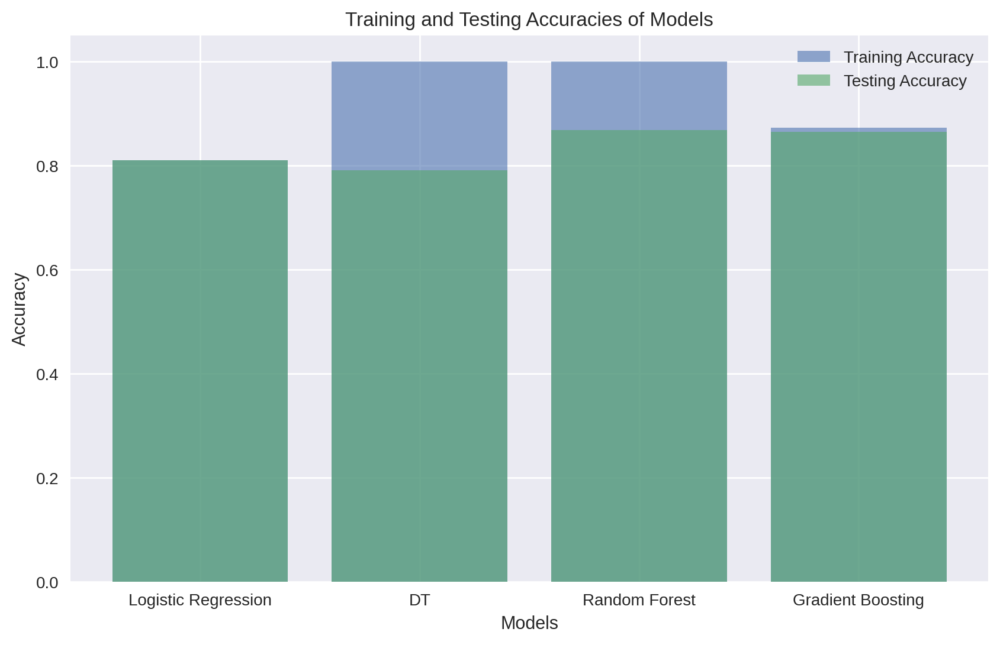

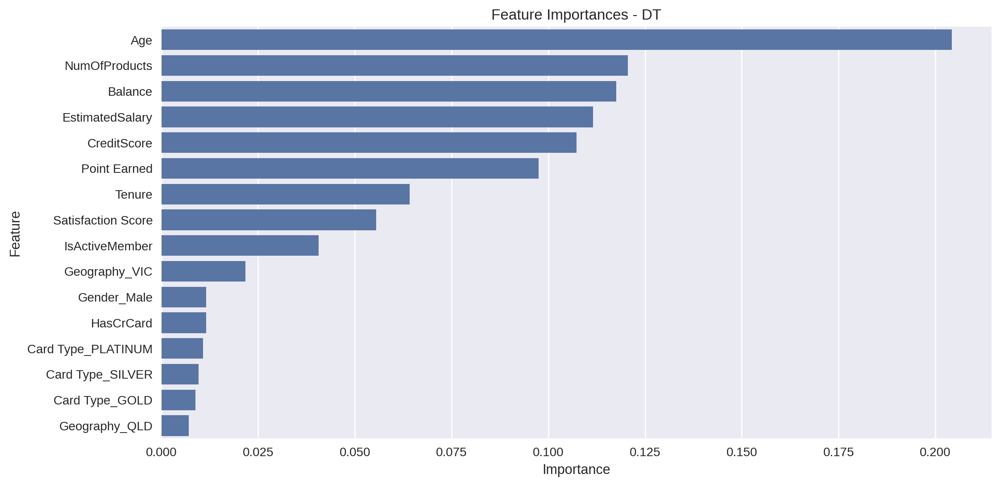

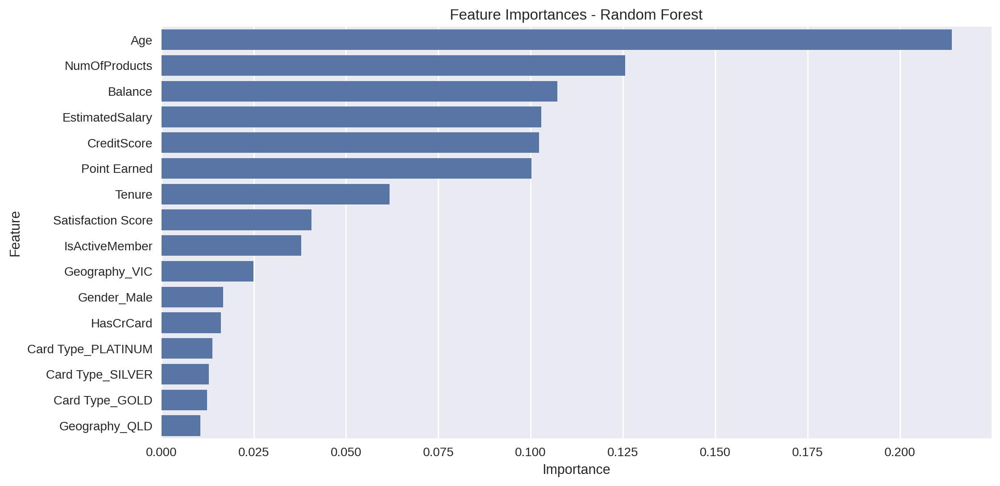

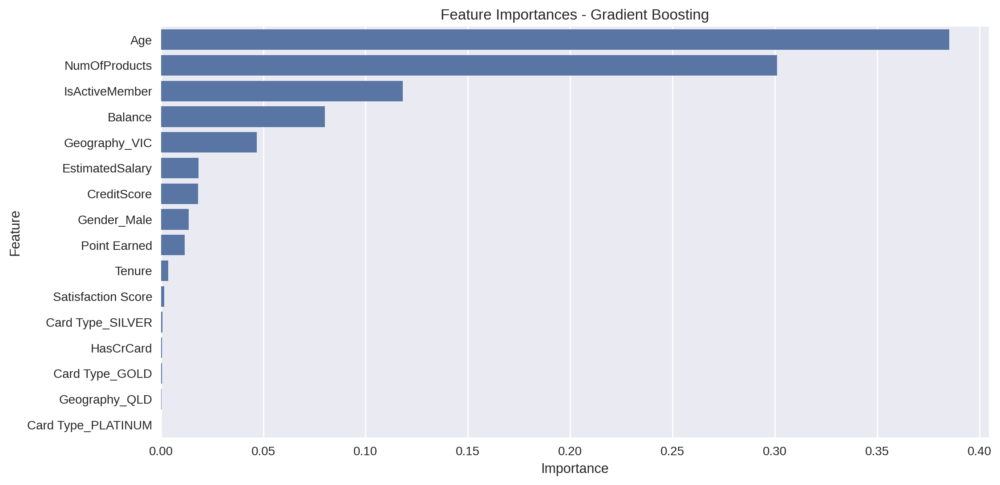

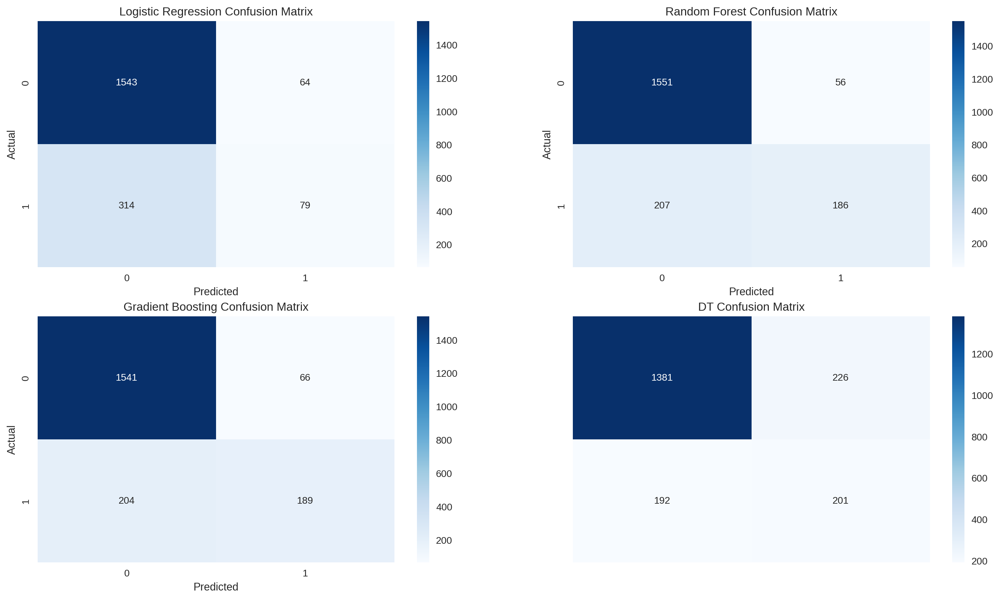

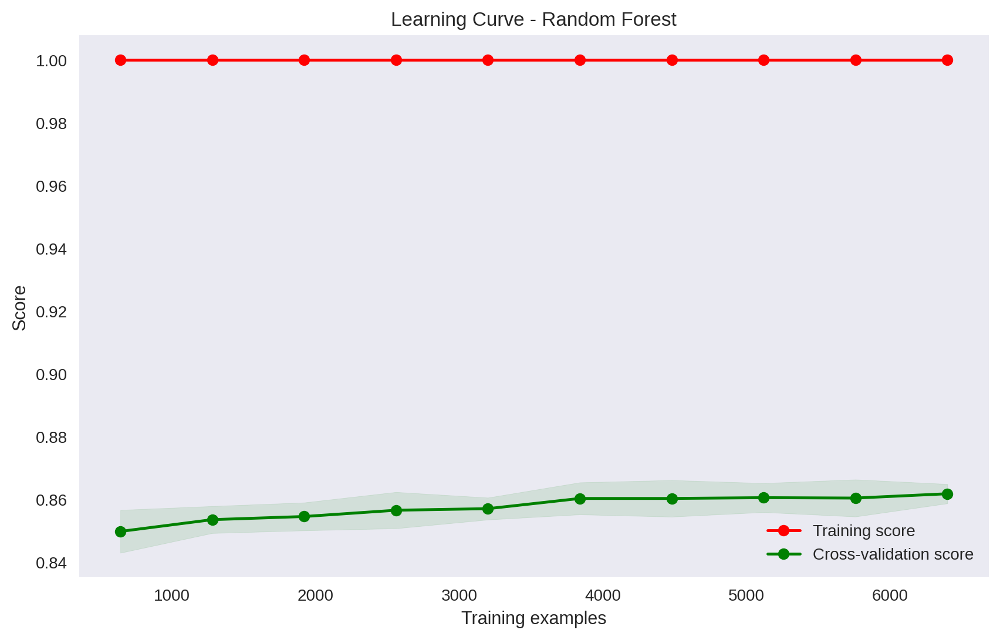

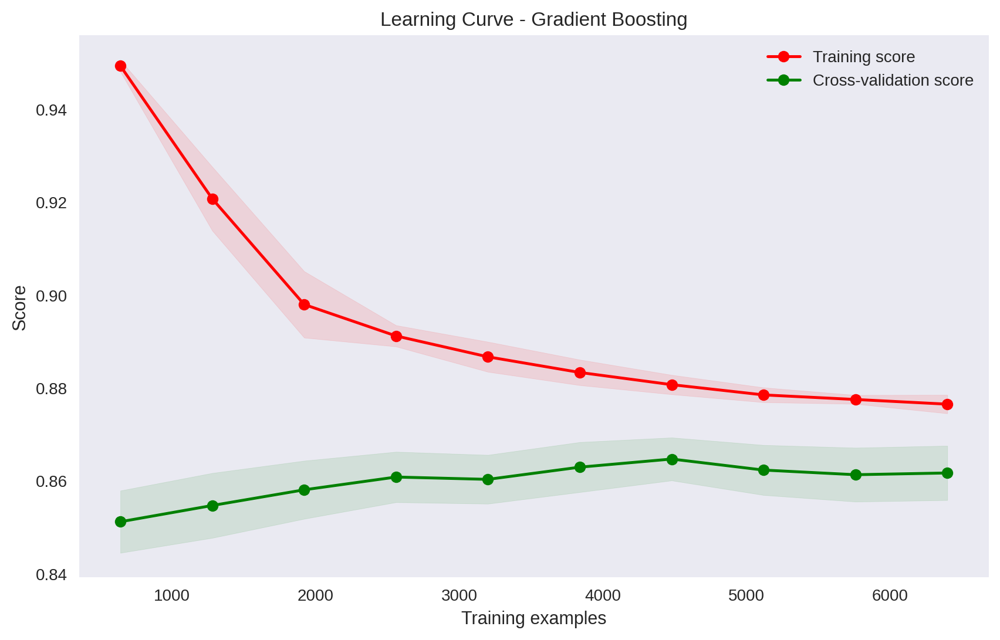

In [10]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split ,learning_curve
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import roc_auc_score, precision_score, recall_score, f1_score, confusion_matrix, roc_curve, auc, accuracy_score
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
import seaborn as sns
# Load the dataset
data = pd.read_csv('Customer-Churn-Records 2025.csv')

# Drop columns that are not needed for prediction and the 'Complain' column to reduce multicollinearity
data = data.drop(['RowNumber', 'CustomerId', 'Surname'], axis=1)

# Define features and target variable
X = data.drop(['Exited', 'Complain'], axis=1)
y = data['Exited']

# Convert categorical variables into dummy/indicator variables
X = pd.get_dummies(X, drop_first=True)

numerical_features = X.select_dtypes(include=[np.number]).columns.tolist()
scaler = StandardScaler()
X[numerical_features] = scaler.fit_transform(X[numerical_features])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the feature variables
#scaler = StandardScaler()
#X_train = scaler.fit_transform(X_train)
#X_test = scaler.transform(X_test)

# Initialize the models
log_reg = LogisticRegression(random_state=42)
dt_clf = DecisionTreeClassifier(criterion='gini',random_state=42)
rf_clf = RandomForestClassifier(random_state=42)
gb_clf = GradientBoostingClassifier(random_state=42)

# Train the models
log_reg.fit(X_train, y_train)
dt_clf.fit(X_train, y_train)
rf_clf.fit(X_train, y_train)
gb_clf.fit(X_train, y_train)

# Predict probabilities for ROC/AUC calculation
y_pred_prob_log_reg = log_reg.predict_proba(X_test)[:, 1]
y_pred_prob_dt_clf = dt_clf.predict_proba(X_test)[:, 1]
y_pred_prob_rf_clf = rf_clf.predict_proba(X_test)[:, 1]
y_pred_prob_gb_clf = gb_clf.predict_proba(X_test)[:, 1]

# Calculate ROC/AUC scores
roc_auc_log_reg = roc_auc_score(y_test, y_pred_prob_log_reg)
roc_auc_dt_clf = roc_auc_score(y_test, y_pred_prob_dt_clf)
roc_auc_rf_clf = roc_auc_score(y_test, y_pred_prob_rf_clf)
roc_auc_gb_clf = roc_auc_score(y_test, y_pred_prob_gb_clf)

# Predict classes for precision and recall calculation
y_pred_log_reg = log_reg.predict(X_test)
y_pred_dt_clf = dt_clf.predict(X_test)
y_pred_rf_clf = rf_clf.predict(X_test)
y_pred_gb_clf = gb_clf.predict(X_test)

# Calculate precision, recall, and F1 scores
precision_log_reg = precision_score(y_test, y_pred_log_reg)
recall_log_reg = recall_score(y_test, y_pred_log_reg)
f1_log_reg = f1_score(y_test, y_pred_log_reg)

precision_dt_clf = precision_score(y_test, y_pred_dt_clf)
recall_dt_clf = recall_score(y_test, y_pred_dt_clf)
f1_dt_clf = f1_score(y_test, y_pred_dt_clf)

precision_rf_clf = precision_score(y_test, y_pred_rf_clf)
recall_rf_clf = recall_score(y_test, y_pred_rf_clf)
f1_rf_clf = f1_score(y_test, y_pred_rf_clf)

precision_gb_clf = precision_score(y_test, y_pred_gb_clf)
recall_gb_clf = recall_score(y_test, y_pred_gb_clf)
f1_gb_clf = f1_score(y_test, y_pred_gb_clf)

# Print the performance metrics
print(f"Logistic Regression - ROC/AUC: {roc_auc_log_reg}, Precision: {precision_log_reg}, Recall: {recall_log_reg}, F1 Score: {f1_log_reg}")
print(f"DT- ROC/AUC: {roc_auc_dt_clf}, Precision: {precision_dt_clf}, Recall: {recall_dt_clf}, F1 Score: {f1_dt_clf}")
print(f"Random Forest - ROC/AUC: {roc_auc_rf_clf}, Precision: {precision_rf_clf}, Recall: {recall_rf_clf}, F1 Score: {f1_rf_clf}")
print(f"Gradient Boosting - ROC/AUC: {roc_auc_gb_clf}, Precision: {precision_gb_clf}, Recall: {recall_gb_clf}, F1 Score: {f1_gb_clf}")

# Plot ROC curves
plt.figure(figsize=(10, 6))
fpr_log_reg, tpr_log_reg, _ = roc_curve(y_test, y_pred_prob_log_reg)
plt.plot(fpr_log_reg, tpr_log_reg, label=f'Logistic Regression (AUC: {roc_auc_log_reg:.2f})')

fpr_dt_clf, tpr_dt_clf, _ = roc_curve(y_test, y_pred_prob_dt_clf)
plt.plot(fpr_dt_clf, tpr_dt_clf, label=f'DT (AUC: {roc_auc_dt_clf:.2f})')

fpr_rf_clf, tpr_rf_clf, _ = roc_curve(y_test, y_pred_prob_rf_clf)
plt.plot(fpr_rf_clf, tpr_rf_clf, label=f'Random Forest (AUC: {roc_auc_rf_clf:.2f})')

fpr_gb_clf, tpr_gb_clf, _ = roc_curve(y_test, y_pred_prob_gb_clf)
plt.plot(fpr_gb_clf, tpr_gb_clf, label=f'Gradient Boosting (AUC: {roc_auc_gb_clf:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()

# Predict on training and testing sets for over- or under-fitting check
y_train_pred_log_reg = log_reg.predict(X_train)
y_test_pred_log_reg = log_reg.predict(X_test)
y_train_pred_dt_clf = dt_clf.predict(X_train)
y_test_pred_dt_clf = dt_clf.predict(X_test)
y_train_pred_rf_clf = rf_clf.predict(X_train)
y_test_pred_rf_clf = rf_clf.predict(X_test)
y_train_pred_gb_clf = gb_clf.predict(X_train)
y_test_pred_gb_clf = gb_clf.predict(X_test)

# Calculate accuracy scores for training and testing sets
train_accuracy_log_reg = accuracy_score(y_train, y_train_pred_log_reg)
test_accuracy_log_reg = accuracy_score(y_test, y_test_pred_log_reg)
train_accuracy_dt_clf = accuracy_score(y_train, y_train_pred_dt_clf)
test_accuracy_dt_clf = accuracy_score(y_test, y_test_pred_dt_clf)
train_accuracy_rf_clf = accuracy_score(y_train, y_train_pred_rf_clf)
test_accuracy_rf_clf = accuracy_score(y_test, y_test_pred_rf_clf)
train_accuracy_gb_clf = accuracy_score(y_train, y_train_pred_gb_clf)
test_accuracy_gb_clf = accuracy_score(y_test, y_test_pred_gb_clf)

# Print the accuracy scores to check for over- or under-fitting
print(f"Logistic Regression - Training Accuracy: {train_accuracy_log_reg}, Testing Accuracy: {test_accuracy_log_reg}")
print(f"DT - Training Accuracy: {train_accuracy_dt_clf}, Testing Accuracy: {test_accuracy_dt_clf}")
print(f"Random Forest - Training Accuracy: {train_accuracy_rf_clf}, Testing Accuracy: {test_accuracy_rf_clf}")
print(f"Gradient Boosting - Training Accuracy: {train_accuracy_gb_clf}, Testing Accuracy: {test_accuracy_gb_clf}")

# Check for data leakage by comparing training and testing accuracies
def check_data_leakage(train_acc, test_acc):
    if abs(train_acc - test_acc) > 0.05:
        return "Possible data leakage detected"
    else:
        return "No significant data leakage detected"

print(f"Logistic Regression - Data Leakage Check: {check_data_leakage(train_accuracy_log_reg, test_accuracy_log_reg)}")
print(f"DT - Data Leakage Check: {check_data_leakage(train_accuracy_dt_clf, test_accuracy_dt_clf)}")
print(f"Random Forest - Data Leakage Check: {check_data_leakage(train_accuracy_rf_clf, test_accuracy_rf_clf)}")
print(f"Gradient Boosting - Data Leakage Check: {check_data_leakage(train_accuracy_gb_clf, test_accuracy_gb_clf)}")

# Visualize the training and testing accuracies for each model
models = ['Logistic Regression', 'DT','Random Forest', 'Gradient Boosting']
train_accuracies = [train_accuracy_log_reg, train_accuracy_dt_clf, train_accuracy_rf_clf, train_accuracy_gb_clf]
test_accuracies = [test_accuracy_log_reg,test_accuracy_dt_clf, test_accuracy_rf_clf, test_accuracy_gb_clf]

plt.figure(figsize=(10, 6))
plt.bar(models, train_accuracies, alpha=0.6, label='Training Accuracy')
plt.bar(models, test_accuracies, alpha=0.6, label='Testing Accuracy')
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Training and Testing Accuracies of Models')
plt.legend()
plt.show()


# Feature importance visualization for DT ,Random Forest and Gradient Boosting models
feature_importances_dt = pd.Series(dt_clf.feature_importances_, index=X.columns).sort_values(ascending=False)
feature_importances_rf = pd.Series(rf_clf.feature_importances_, index=X.columns).sort_values(ascending=False)
feature_importances_gb = pd.Series(gb_clf.feature_importances_, index=X.columns).sort_values(ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(x=feature_importances_dt.values, y=feature_importances_rf.index)
plt.title('Feature Importances - DT')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

plt.figure(figsize=(12, 6))
sns.barplot(x=feature_importances_rf.values, y=feature_importances_rf.index)
plt.title('Feature Importances - Random Forest')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

plt.figure(figsize=(12, 6))
sns.barplot(x=feature_importances_gb.values, y=feature_importances_gb.index)
plt.title('Feature Importances - Gradient Boosting')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

# Confusion Matrix for each model
cm_log_reg = confusion_matrix(y_test, y_pred_log_reg)
cm_dt_clf = confusion_matrix(y_test, y_pred_dt_clf)
cm_rf_clf = confusion_matrix(y_test, y_pred_rf_clf)
cm_gb_clf = confusion_matrix(y_test, y_pred_gb_clf)

# Plot Confusion Matrix
fig, axes = plt.subplots(2, 2, figsize=(18, 10))
sns.heatmap(cm_log_reg, annot=True, fmt='d', cmap='Blues', ax=axes[0, 0])
axes[0, 0].set_title('Logistic Regression Confusion Matrix')
axes[0, 0].set_xlabel('Predicted')
axes[0, 0].set_ylabel('Actual')

sns.heatmap(cm_dt_clf, annot=True, fmt='d', cmap='Blues', ax=axes[1, 1])
axes[1, 1].set_title('DT Confusion Matrix')
axes[1, 1].set_xlabel('Predicted')
axes[1, 1].set_ylabel('Actual')

sns.heatmap(cm_rf_clf, annot=True, fmt='d', cmap='Blues', ax=axes[0, 1])
axes[0, 1].set_title('Random Forest Confusion Matrix')
axes[0, 1].set_xlabel('Predicted')
axes[0, 1].set_ylabel('Actual')

sns.heatmap(cm_gb_clf, annot=True, fmt='d', cmap='Blues', ax=axes[1, 0])
axes[1, 0].set_title('Gradient Boosting Confusion Matrix')
axes[1, 0].set_xlabel('Predicted')
axes[1, 0].set_ylabel('Actual')

# Hide the empty subplot
axes[1, 1].axis('off')

plt.show()

# Generate learning curves for Random Forest
train_sizes_rf, train_scores_rf, test_scores_rf = learning_curve(rf_clf, X_train, y_train, cv=5, n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10))

# Calculate mean and standard deviation for training and test scores
train_scores_mean_rf = np.mean(train_scores_rf, axis=1)
train_scores_std_rf = np.std(train_scores_rf, axis=1)
test_scores_mean_rf = np.mean(test_scores_rf, axis=1)
test_scores_std_rf = np.std(test_scores_rf, axis=1)

# Plot learning curve for Random Forest
plt.figure(figsize=(10, 6))
plt.plot(train_sizes_rf, train_scores_mean_rf, 'o-', color='r', label='Training score')
plt.plot(train_sizes_rf, test_scores_mean_rf, 'o-', color='g', label='Cross-validation score')
plt.fill_between(train_sizes_rf, train_scores_mean_rf - train_scores_std_rf,
                 train_scores_mean_rf + train_scores_std_rf, alpha=0.1, color='r')
plt.fill_between(train_sizes_rf, test_scores_mean_rf - test_scores_std_rf,
                 test_scores_mean_rf + test_scores_std_rf, alpha=0.1, color='g')
plt.xlabel('Training examples')
plt.ylabel('Score')
plt.title('Learning Curve - Random Forest')
plt.legend(loc='best')
plt.grid()
plt.show()

# Generate learning curves for Gradient Boosting
train_sizes_gb, train_scores_gb, test_scores_gb = learning_curve(gb_clf, X_train, y_train, cv=5, n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10))

# Calculate mean and standard deviation for training and test scores
train_scores_mean_gb = np.mean(train_scores_gb, axis=1)
train_scores_std_gb = np.std(train_scores_gb, axis=1)
test_scores_mean_gb = np.mean(test_scores_gb, axis=1)
test_scores_std_gb = np.std(test_scores_gb, axis=1)

# Plot learning curve for Gradient Boosting
plt.figure(figsize=(10, 6))
plt.plot(train_sizes_gb, train_scores_mean_gb, 'o-', color='r', label='Training score')
plt.plot(train_sizes_gb, test_scores_mean_gb, 'o-', color='g', label='Cross-validation score')
plt.fill_between(train_sizes_gb, train_scores_mean_gb - train_scores_std_gb,
                 train_scores_mean_gb + train_scores_std_gb, alpha=0.1, color='r')
plt.fill_between(train_sizes_gb, test_scores_mean_gb - test_scores_std_gb,
                 test_scores_mean_gb + test_scores_std_gb, alpha=0.1, color='g')
plt.xlabel('Training examples')
plt.ylabel('Score')
plt.title('Learning Curve - Gradient Boosting')
plt.legend(loc='best')
plt.grid()
plt.show()

Addressing the Impact:
To address this issue, 

Feature Selection: Remove one of the highly correlated features to reduce multicollinearity.


# Data Pre-processing

In [11]:
# Drop columns that are not useful for prediction
columns_to_drop = ['rownumber','customerid','surname']
df.drop(columns=columns_to_drop, inplace=True)


In [12]:
# Feature Analysis - Numerical
df[df.columns[df.dtypes != object]].describe()

,creditscore,age,tenure,balance,numofproducts,hascrcard,isactivemember,estimatedsalary,exited,complain,satisfaction score,point earned
count,10000.000,10000.000,10000.000,10000.000,10000.000,10000.000,10000.000,10000.000,10000.000,10000.000,10000.000,10000.000
mean,650.529,38.922,5.013,76485.889,1.530,0.706,0.515,100090.240,0.204,0.204,3.014,606.515
std,96.653,10.488,2.892,62397.405,0.582,0.456,0.500,57510.493,0.403,0.403,1.406,225.925
min,350.000,18.000,0.000,0.000,1.000,0.000,0.000,11.580,0.000,0.000,1.000,119.000
25%,584.000,32.000,3.000,0.000,1.000,0.000,0.000,51002.110,0.000,0.000,2.000,410.000
50%,652.000,37.000,5.000,97198.540,1.000,1.000,1.000,100193.915,0.000,0.000,3.000,605.000
75%,718.000,44.000,7.000,127644.240,2.000,1.000,1.000,149388.247,0.000,0.000,4.000,801.000
max,850.000,92.000,10.000,250898.090,4.000,1.000,1.000,199992.480,1.000,1.000,5.000,1000.000


In [13]:
# Feature Analysis - Categorical


def print_cat_col_values(df, print_levels=True, print_perc=False, dont_print_more_than=10):
    
    cat_cols = df.columns[df.dtypes==object].tolist()
    
    if print_levels:
        if print_perc:
            print('printing percentage counts:\n')
        else:
            print('printing absolute counts:\n')
        
    for col in cat_cols:
        print(f'{col}: {df[col].nunique()} unique values')
        if print_levels:
            if print_perc:
                print(df[col].value_counts(normalize=True).round(4)[:dont_print_more_than]*100)
            else:
                print(df[col].value_counts()[:dont_print_more_than])
        print('########\n')    
        
        
print_cat_col_values(df, print_levels=True, print_perc=True)

printing percentage counts:

geography: 3 unique values
geography
NSW   50.140
VIC   25.090
QLD   24.770
Name: proportion, dtype: float64
########

gender: 2 unique values
gender
Male     54.570
Female   45.430
Name: proportion, dtype: float64
########

card type: 4 unique values
card type
DIAMOND    25.070
GOLD       25.020
SILVER     24.960
PLATINUM   24.950
Name: proportion, dtype: float64
########



In [14]:
categorical_cols = df.select_dtypes(include=['object']).columns

print(categorical_cols)

Index(['geography', 'gender', 'card type'], dtype='object')


In [15]:
age_bins = [0, 20, 30, 40, 50, 60, 70 , float('inf')]
age_labels = ['age group_0-20', 'age group_21-30', 'age group_31-40', 'age group_41-50', 
              'age group_51-60', 'age group_61-70', 'age group_70+']
df['age_Group'] = pd.cut(df['age'], bins=age_bins, labels=age_labels, right=False)
# Display the value counts of the 'Age' column after discretization
age_value_counts = df['age'].value_counts()
print("\nValue counts of the 'Age' column after discretization:")
print(age_value_counts)
# OR use dummy encoding for categorical features with > 2 levels
#df = pd.get_dummies(df, drop_first=True, dtype=int)
# Create bins for 'NumOfProducts'
num_of_products_bins = [1, 2, 3, 4, float('inf')]
num_of_products_labels = ['1 product', '2 products', '3 products', '4+ products']
df['numofproducts_Binned'] = pd.cut(df['numofproducts'], bins=num_of_products_bins, labels=num_of_products_labels, right=False)

# Create bins for 'Satisfaction Score'
satisfaction_score_bins = [1,2,3,4,5, float('inf')]
satisfaction_score_labels = ['satisfaction_1', 'satisfaction_2', 'satisfaction_3','satisfaction_4','satisfaction_5']
df['satisfaction_score_Binned'] = pd.cut(df['satisfaction score'], bins=satisfaction_score_bins, labels=satisfaction_score_labels, right=False)



Value counts of the 'Age' column after discretization:
age
37    478
38    477
35    474
36    456
34    447
     ... 
84      2
82      1
88      1
85      1
83      1
Name: count, Length: 70, dtype: int64


In [16]:
# perform dummy/ one-hot-encoding

for col in categorical_cols:
    if (df[col].nunique() == 2):
        df[col] = pd.get_dummies(df[col], drop_first=True, dtype=int)
   
# use one-hot-encoding for categorical features with > 2 levels
df = pd.get_dummies(df, dtype=int)



In [17]:
list(df.columns)

['creditscore',
 'gender',
 'age',
 'tenure',
 'balance',
 'numofproducts',
 'hascrcard',
 'isactivemember',
 'estimatedsalary',
 'exited',
 'complain',
 'satisfaction score',
 'point earned',
 'geography_NSW',
 'geography_QLD',
 'geography_VIC',
 'card type_DIAMOND',
 'card type_GOLD',
 'card type_PLATINUM',
 'card type_SILVER',
 'age_Group_age group_0-20',
 'age_Group_age group_21-30',
 'age_Group_age group_31-40',
 'age_Group_age group_41-50',
 'age_Group_age group_51-60',
 'age_Group_age group_61-70',
 'age_Group_age group_70+',
 'numofproducts_Binned_1 product',
 'numofproducts_Binned_2 products',
 'numofproducts_Binned_3 products',
 'numofproducts_Binned_4+ products',
 'satisfaction_score_Binned_satisfaction_1',
 'satisfaction_score_Binned_satisfaction_2',
 'satisfaction_score_Binned_satisfaction_3',
 'satisfaction_score_Binned_satisfaction_4',
 'satisfaction_score_Binned_satisfaction_5']

In [18]:
print(df.head())

   creditscore  gender  age  tenure    balance  numofproducts  hascrcard  \
0          619       0   42       2      0.000              1          1   
1          608       0   41       1  83807.860              1          0   
2          502       0   42       8 159660.800              3          1   
3          699       0   39       1      0.000              2          0   
4          850       0   43       2 125510.820              1          1   

   isactivemember  estimatedsalary  exited  ...  age_Group_age group_70+  \
0               1       101348.880       1  ...                        0   
1               1       112542.580       0  ...                        0   
2               0       113931.570       1  ...                        0   
3               0        93826.630       0  ...                        0   
4               1        79084.100       0  ...                        0   

   numofproducts_Binned_1 product  numofproducts_Binned_2 products  \
0               

In [19]:
# Checking duplicates 
print(df.shape)
df = df.drop_duplicates(keep="first")
print(df.shape)

(10000, 36)
(10000, 36)


# Decision tree hyperparameter tuning

Fitting 3 folds for each of 216 candidates, totalling 648 fits
[CV] END max_depth=0, min_samples_leaf=0, min_samples_split=0; total time=   0.0s
[CV] END max_depth=0, min_samples_leaf=0, min_samples_split=1; total time=   0.0s
[CV] END max_depth=0, min_samples_leaf=0, min_samples_split=4; total time=   0.0s
[CV] END max_depth=0, min_samples_leaf=0, min_samples_split=4; total time=   0.0s
[CV] END max_depth=0, min_samples_leaf=1, min_samples_split=0; total time=   0.0s
[CV] END max_depth=0, min_samples_leaf=1, min_samples_split=1; total time=   0.0s
[CV] END max_depth=0, min_samples_leaf=2, min_samples_split=0; total time=   0.0s
[CV] END max_depth=0, min_samples_leaf=2, min_samples_split=0; total time=   0.0s
[CV] END max_depth=0, min_samples_leaf=2, min_samples_split=0; total time=   0.0s
[CV] END max_depth=0, min_samples_leaf=2, min_samples_split=1; total time=   0.0s
[CV] END max_depth=0, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END max_depth=0, min_samples_l

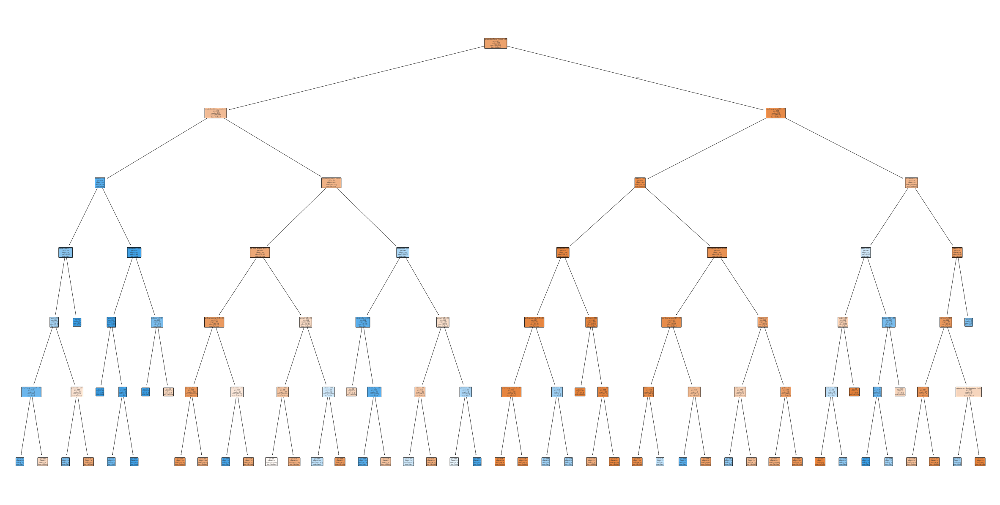

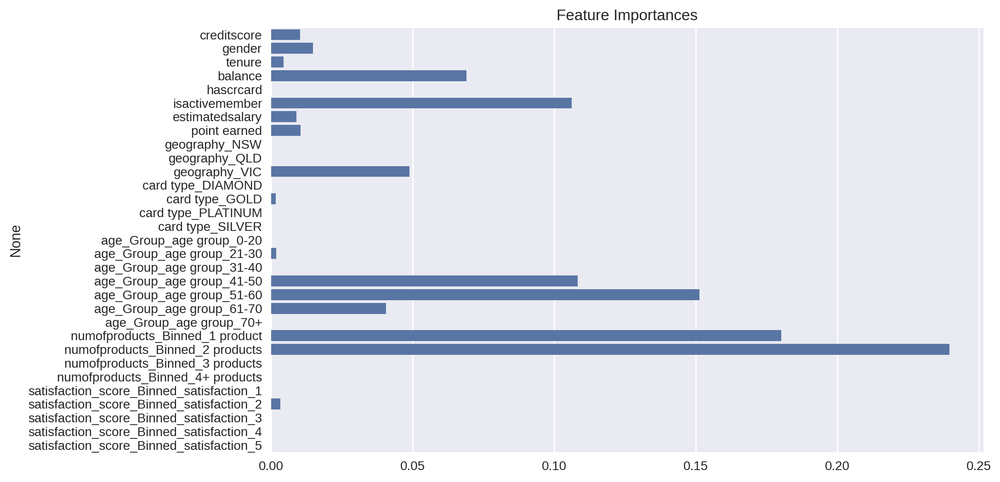

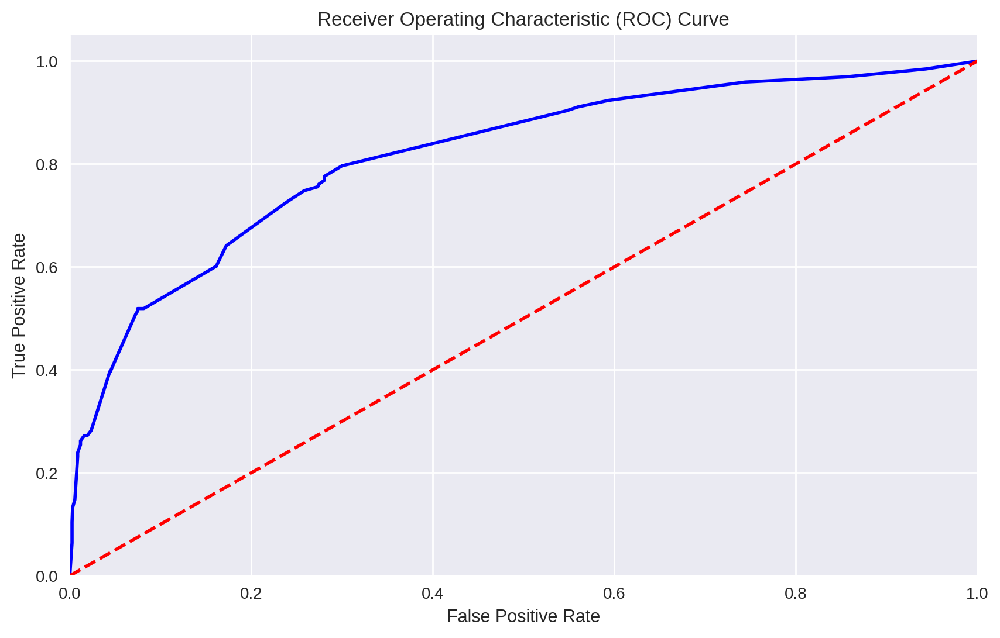

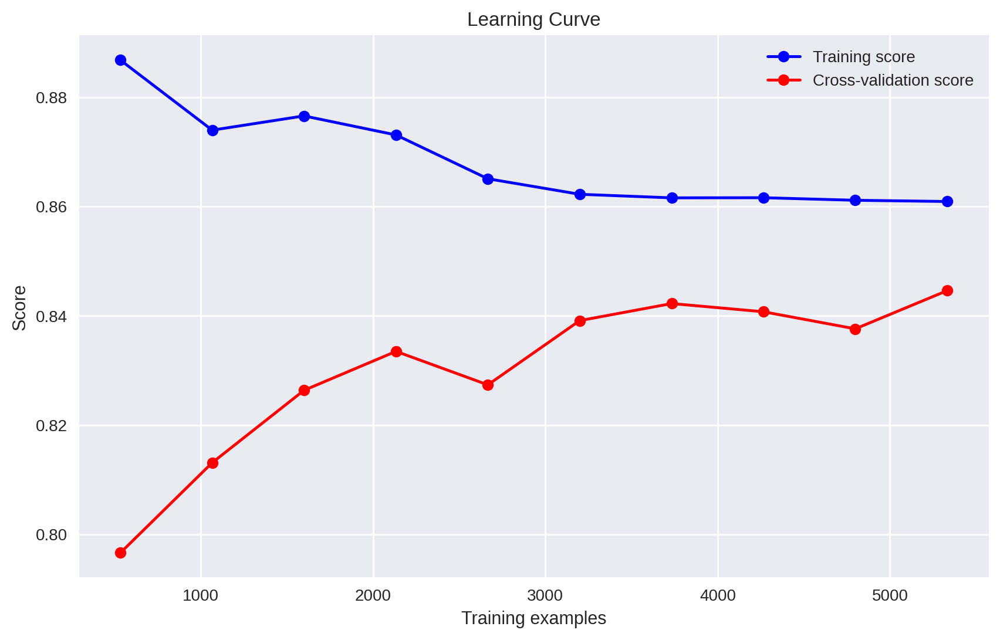

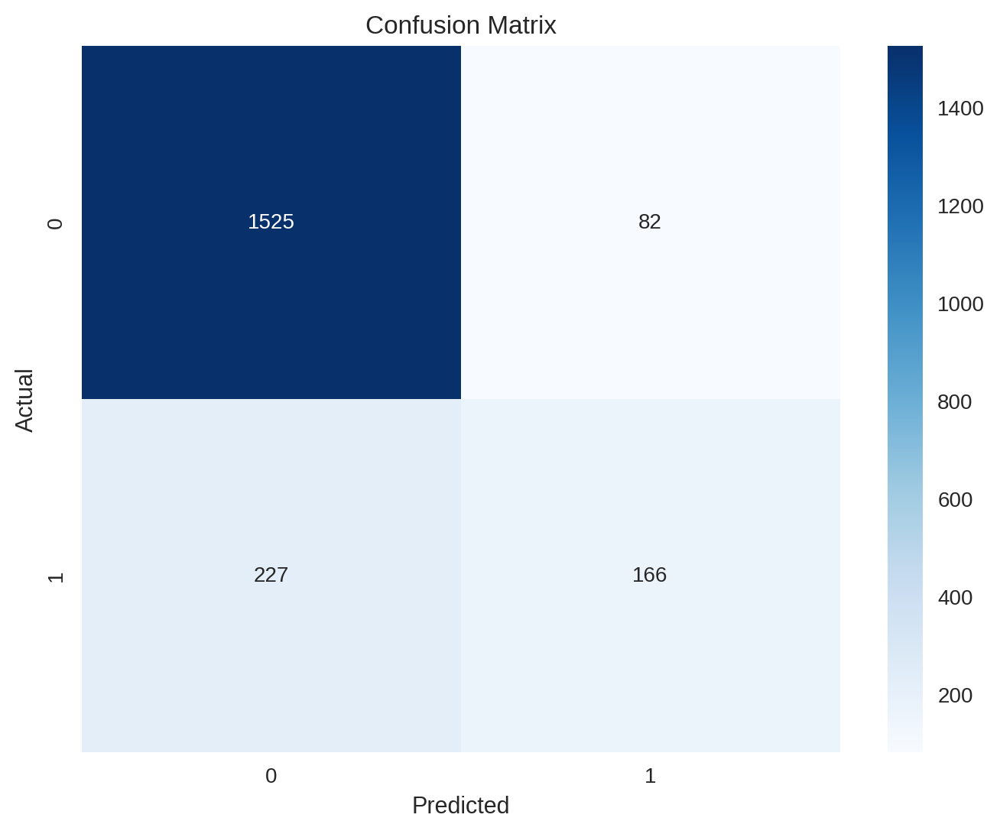

In [20]:
from sklearn.model_selection import train_test_split,learning_curve
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, roc_auc_score
import time

scaler = StandardScaler()
# Fit and transform the balance and estimated_salary fields
df[['balance', 'estimatedsalary','creditscore']] = scaler.fit_transform(df[['balance', 'estimatedsalary','creditscore']])
# Split the data into features and target variable
X = df.drop(['exited', 'complain','age','numofproducts','satisfaction score'], axis=1)
y = df['exited']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#clf = DecisionTreeClassifier(criterion='gini',random_state=42,max_depth=10, min_samples_split=7, min_samples_leaf=4)

param_grid = {
    'max_depth': np.arange(9),
    'min_samples_split': np.arange(6),
    'min_samples_leaf': np.arange(4),
}
start_time = time.time()   
clf = DecisionTreeClassifier(random_state=42)
grid_search = GridSearchCV(estimator = clf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)

start_time = time.time()                          
# Train the model
grid_search.fit(X_train, y_train)

end_time = time.time()
elapsed_time = end_time - start_time
# Get predicted probabilities 
y_scores = grid_search.predict_proba(X_test)[:,1]

 
grid_search.best_params_

# Train the model with best parameters
best_grid = grid_search.best_estimator_
best_grid.fit(X_train, y_train)

# Visualise the decision tree
plt.figure(figsize=(15,7.5))
plot_tree(best_grid, filled=True, rounded=True,
          feature_names=X.columns,
          class_names=['Not Exited','Exited'])
plt.show()

# Predict the response for the test dataset
y_pred = best_grid.predict(X_test)

# Create a confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Print evaluation metrics
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))
print("Precision:", metrics.precision_score(y_test, y_pred))
print("Recall:", metrics.recall_score(y_test, y_pred))
print("F1 score:", metrics.f1_score(y_test, y_pred))

# Feature importance
feature_importances = best_grid.feature_importances_
features = X.columns

plt.figure(figsize=(10,6))
sns.barplot(x=feature_importances, y=features)
plt.title('Feature Importances')
plt.show()

# ROC/AUC curve
y_pred_proba = best_grid.predict_proba(X_test)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)

plt.figure(figsize=(10,6))
plt.plot(fpr, tpr, color='blue', lw=2)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.show()

print(f'ROC AUC: {roc_auc}')

print(f"Hyperparameter tuning took: {elapsed_time:.2f} seconds")
# Learning curve
train_sizes, train_scores, test_scores = learning_curve(best_grid,
                                                        X_train,
                                                        y_train,
                                                        cv=3,
                                                        n_jobs=-1,
                                                        train_sizes=np.linspace(0.1, 1.0, 10))

train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

plt.figure(figsize=(10,6))
plt.plot(train_sizes, train_scores_mean, 'o-', color='blue', label='Training score')
plt.plot(train_sizes, test_scores_mean, 'o-', color='red', label='Cross-validation score')
plt.xlabel('Training examples')
plt.ylabel('Score')
plt.title('Learning Curve')
plt.legend(loc='best')
plt.show()

# Confusion matrix visualization
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


# Hyperparameter tuning for a Random forest model

In [21]:
# Random forest hyperparameter tuning
from sklearn.model_selection import GridSearchCV
import time

scaler = StandardScaler()
# Fit and transform the balance and estimated_salary fields
df[['balance', 'estimatedsalary','creditscore']] = scaler.fit_transform(df[['balance', 'estimatedsalary','creditscore']])
# Split the data into features and target variable
X = df.drop(['exited', 'complain','age','numofproducts','satisfaction score'], axis=1)
y = df['exited']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the parameter grid
param_grid = {
    'n_estimators': [200],
    'max_depth': [None ],
    'min_samples_split': [2 ],
    'min_samples_leaf': [2]
}

# Create a Random Forest Classifier with the parameter grid
rf_clf = RandomForestClassifier(class_weight='balanced', random_state=42)

start_time = time.time()

# Instantiate the grid search model
grid_search = GridSearchCV(estimator=rf_clf, param_grid=param_grid, cv=3)

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

end_time = time.time()
elapsed_time = end_time - start_time

# Get the best parameters
best_params_rf = grid_search.best_params_

print(f'Best parameters for Random Forest: {best_params_rf}')

# Train the model with best parameters
best_grid = grid_search.best_estimator_
best_grid.fit(X_train, y_train)

# Predict the response for the test dataset
y_pred = best_grid.predict(X_test)

# Create a confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Print evaluation metrics
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))
print("Precision:", metrics.precision_score(y_test, y_pred))
print("Recall:", metrics.recall_score(y_test, y_pred))
print("F1 score:", metrics.f1_score(y_test, y_pred))

print(f"Hyperparameter tuning took: {elapsed_time:.2f} seconds")

Best parameters for Random Forest: {'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}
Accuracy: 0.8545
Precision: 0.656441717791411
Recall: 0.544529262086514
F1 score: 0.5952712100139083
Hyperparameter tuning took: 3.52 seconds


# GBM hyperparameter tuning

Fitting 3 folds for each of 1 candidates, totalling 3 fits
Best parameters for GBM: {'learning_rate': 0.4, 'max_depth': 5, 'max_features': 'sqrt', 'min_samples_leaf': 10, 'min_samples_split': 5, 'n_estimators': 49, 'subsample': 0.9}
Accuracy: 0.859
Precision: 0.688135593220339
Recall: 0.5165394402035624
F1 score: 0.5901162790697675
Hyperparameter tuning took: 0.41 seconds


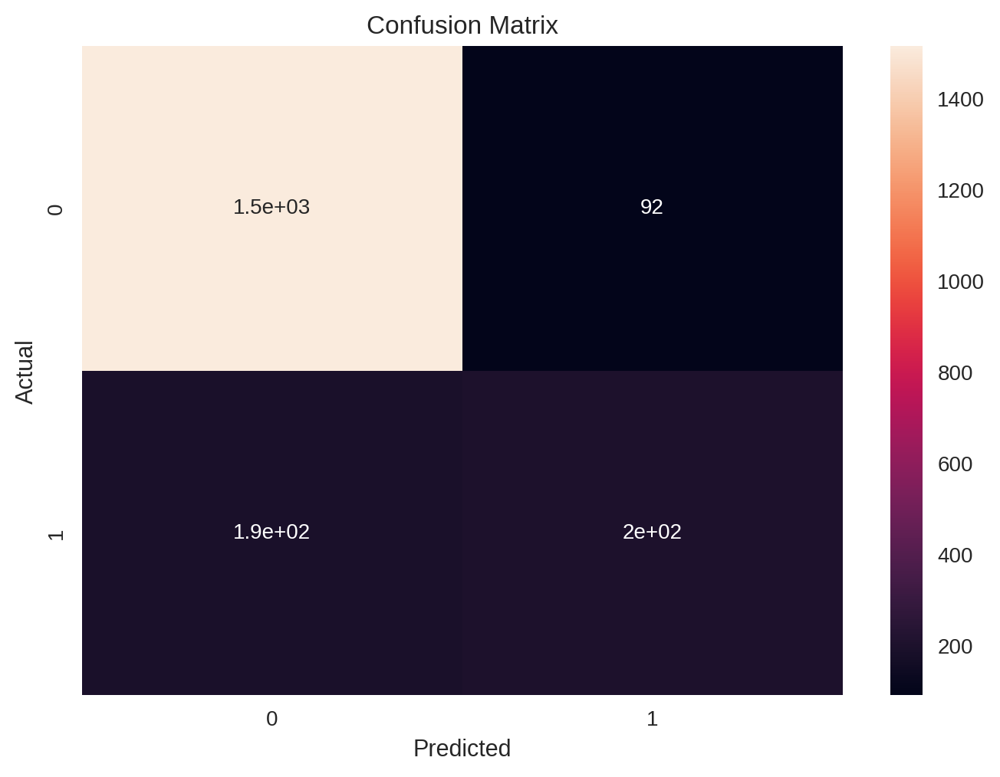

In [22]:
# GBM hyperparameter tuning
from sklearn.model_selection import GridSearchCV
import time

# Define the parameter grid
param_grid = {
    'n_estimators': [49],
    'learning_rate': [0.4],
       'max_depth': [5],
    'min_samples_split': [5],
    'min_samples_leaf': [10],
     'subsample': [0.9],
    'max_features': ['sqrt']
}

# Create a GBM Classifier with the parameter grid
gbm_clf = GradientBoostingClassifier(random_state=42)

start_time = time.time()

# Instantiate the grid search model
grid_search = GridSearchCV(estimator=gbm_clf, param_grid=param_grid, cv=3,n_jobs=-1, verbose=2)

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

end_time = time.time()
elapsed_time = end_time - start_time

# Get the best parameters
best_params_gbm = grid_search.best_params_

print(f'Best parameters for GBM: {best_params_gbm}')

# Train the model with best parameters
best_grid = grid_search.best_estimator_
best_grid.fit(X_train, y_train)

# Predict the response for the test dataset
y_pred = best_grid.predict(X_test)

# Create a confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Visualize the confusion matrix
sns.heatmap(cm, annot=True)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Print evaluation metrics
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))
print("Precision:", metrics.precision_score(y_test, y_pred))
print("Recall:", metrics.recall_score(y_test, y_pred))
print("F1 score:", metrics.f1_score(y_test, y_pred))

print(f"Hyperparameter tuning took: {elapsed_time:.2f} seconds")

Loading the Dataset: The dataset is loaded using pd.read_csv().
Dropping Columns: The 'RowNumber', 'CustomerId', and 'Surname' columns are dropped.
Checking for Missing Values: Missing values in the dataset are checked and displayed.
Discretizing Variables: The 'Age', 'NumOfProducts', and 'Satisfaction Score' columns are discretized into bins.
Dropping Columns: The 'Complain', 'Age', 'NumOfProducts', and 'Satisfaction Score' columns are dropped from the training dataset.
Converting Categorical Variables: Categorical variables are converted to dummy variables using pd.get_dummies().
Standardizing Numerical Features: Numerical features are standardized using StandardScaler() to ensure they have a mean of 0 and a standard deviation of 1.
Splitting Data: The data is split into features (X) and target variable (y), and then into training and testing sets using train_test_split().
Handling Class Imbalance: sampling tech is used to handle class imbalance.

Training and Evaluating Models:
Decision Tree: The Decision Tree classifier is trained and evaluated.
Random Forest: The Random Forest classifier is trained and evaluated.
Gradient Boosting Machine (GBM): The GBM classifier is trained and evaluated.
Feature Importance: Feature importance is displayed for Random Forest and GBM classifiers.

# SMOTE + CNN with Hyperparameter tuning DT


[CV] END max_depth=6, min_samples_leaf=2, min_samples_split=4; total time=   0.0s
[CV] END max_depth=6, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=6, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=6, min_samples_leaf=2, min_samples_split=5; total time=   0.0s
[CV] END max_depth=6, min_samples_leaf=3, min_samples_split=0; total time=   0.0s
[CV] END max_depth=6, min_samples_leaf=3, min_samples_split=0; total time=   0.0s
[CV] END max_depth=6, min_samples_leaf=3, min_samples_split=0; total time=   0.0s
[CV] END max_depth=6, min_samples_leaf=3, min_samples_split=1; total time=   0.0s
[CV] END max_depth=6, min_samples_leaf=3, min_samples_split=1; total time=   0.0s
[CV] END max_depth=6, min_samples_leaf=3, min_samples_split=1; total time=   0.0s
[CV] END max_depth=6, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=6, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_de

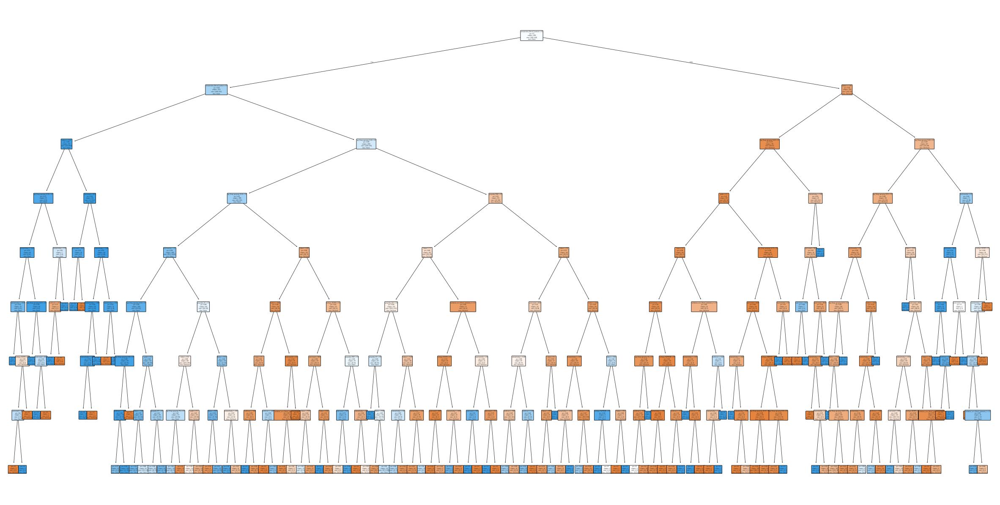

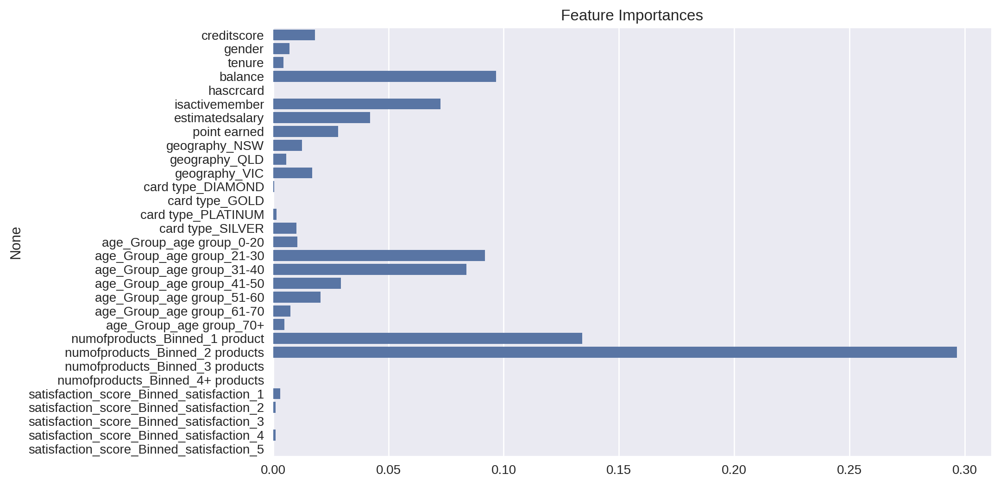

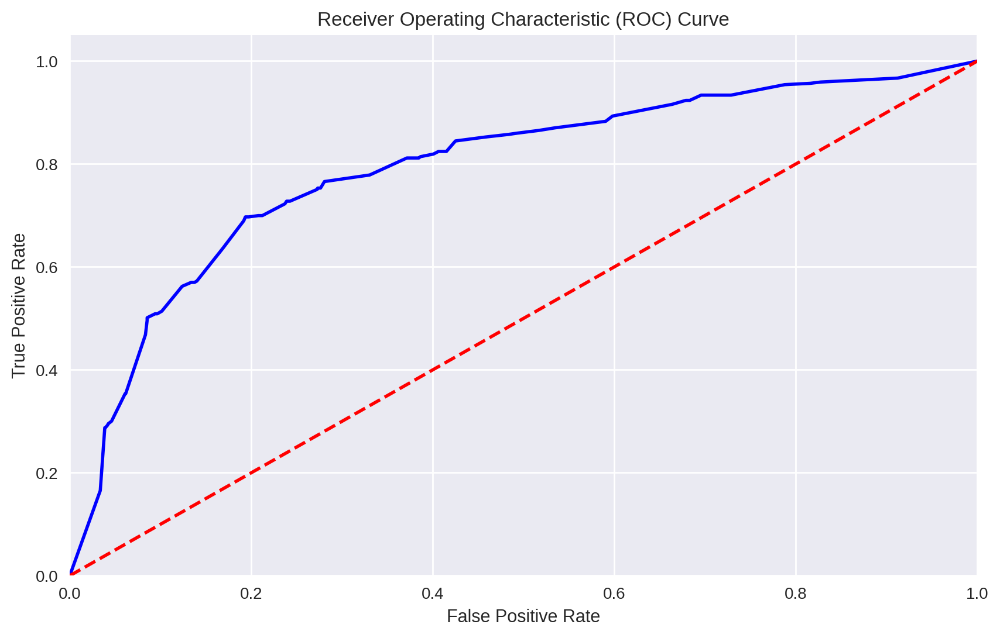

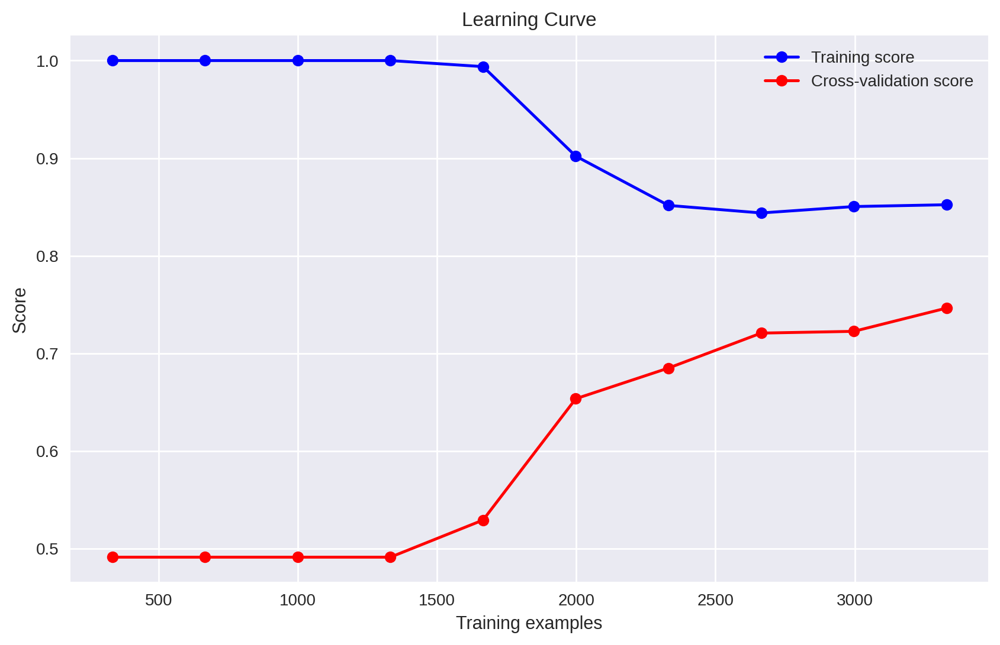

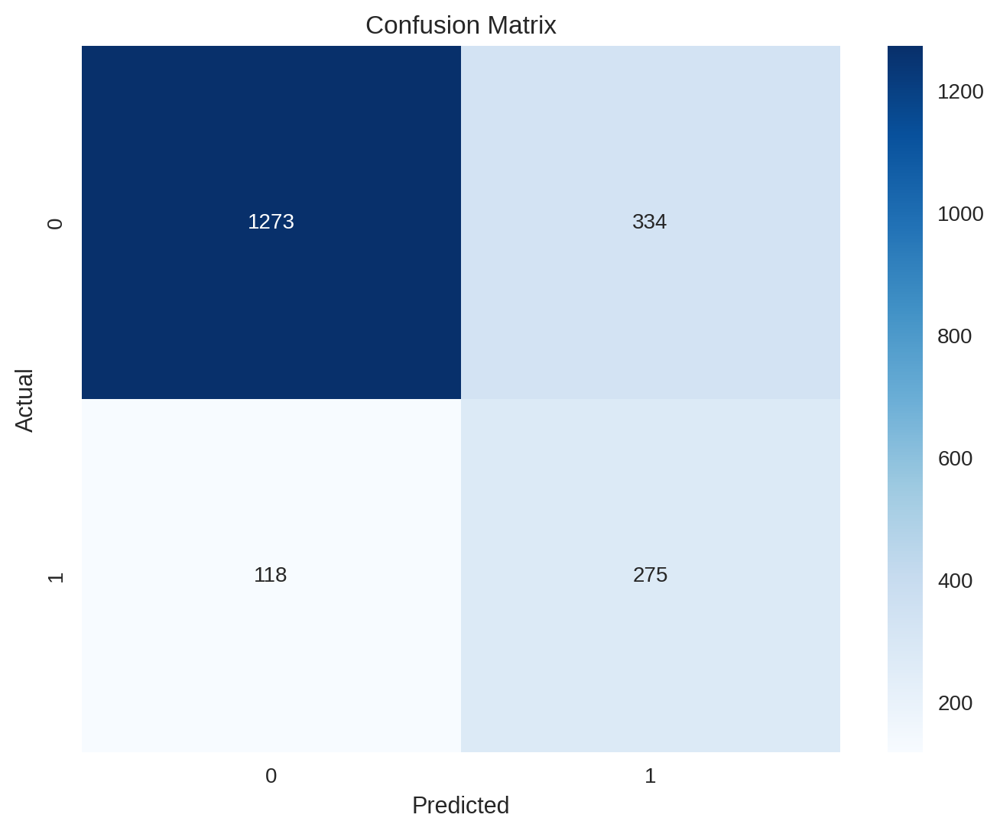

In [23]:
# Decision tree hyperparameter tuning
from sklearn.model_selection import GridSearchCV, learning_curve, train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.under_sampling import CondensedNearestNeighbour
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import confusion_matrix, roc_curve, roc_auc_score
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

scaler = StandardScaler()
# Fit and transform the balance and estimated_salary fields
df[['balance', 'estimatedsalary','creditscore']] = scaler.fit_transform(df[['balance', 'estimatedsalary','creditscore']])

# Split the data into features and target variable
X = df.drop(['exited', 'complain','age','numofproducts','satisfaction score'], axis=1)
y = df['exited']

# Standardize the numerical features before splitting the data
#numerical_features = X.select_dtypes(include=[np.number]).columns.tolist()
#scaler = StandardScaler()
#X[numerical_features] = scaler.fit_transform(X[numerical_features])

 
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


# Apply SMOTE to the training data
smote = SMOTE(sampling_strategy=0.4, k_neighbors=5, random_state=45)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Apply CNN to the SMOTE-resampled data
cnn = CondensedNearestNeighbour(n_neighbors=1)
X_train_res, y_train_res = cnn.fit_resample(X_train_smote, y_train_smote)


param_grid = {
    'max_depth': np.arange(9),
    'min_samples_split': np.arange(6),
    'min_samples_leaf': np.arange(4),
}

clf = DecisionTreeClassifier(random_state=42)
grid_search = GridSearchCV(estimator = clf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)

grid_search.fit(X_train_res, y_train_res)

grid_search.best_params_

# Train the model with best parameters
best_grid = grid_search.best_estimator_
best_grid.fit(X_train_res, y_train_res)

# Visualise the decision tree
plt.figure(figsize=(15,7.5))
plot_tree(best_grid, filled=True, rounded=True,
          feature_names=X.columns,
          class_names=['Not Exited','Exited'])
plt.show()

# Predict the response for the test dataset
y_pred = best_grid.predict(X_test)

# Create a confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Print evaluation metrics
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))
print("Precision:", metrics.precision_score(y_test, y_pred))
print("Recall:", metrics.recall_score(y_test, y_pred))
print("F1 score:", metrics.f1_score(y_test, y_pred))

# Feature importance
feature_importances = best_grid.feature_importances_
features = X.columns

plt.figure(figsize=(10,6))
sns.barplot(x=feature_importances, y=features)
plt.title('Feature Importances')
plt.show()

# ROC/AUC curve
y_pred_proba = best_grid.predict_proba(X_test)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)

plt.figure(figsize=(10,6))
plt.plot(fpr, tpr, color='blue', lw=2)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.show()

print(f'ROC AUC: {roc_auc}')

# Learning curve
train_sizes, train_scores, test_scores = learning_curve(best_grid,
                                                        X_train_res,
                                                        y_train_res,
                                                        cv=3,
                                                        n_jobs=-1,
                                                        train_sizes=np.linspace(0.1, 1.0, 10))

train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

plt.figure(figsize=(10,6))
plt.plot(train_sizes, train_scores_mean, 'o-', color='blue', label='Training score')
plt.plot(train_sizes, test_scores_mean, 'o-', color='red', label='Cross-validation score')
plt.xlabel('Training examples')
plt.ylabel('Score')
plt.title('Learning Curve')
plt.legend(loc='best')
plt.show()

# Confusion matrix visualization
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# SMOTE + CNN with Hyperparameter tuning for a random forest model

Fitting 3 folds for each of 1 candidates, totalling 3 fits
Best parameters for Random Forest: {'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}
Accuracy: 0.827
Precision: 0.5469061876247505
Recall: 0.6972010178117048
F1 score: 0.6129753914988815
ROC AUC: 0.8472490741048624


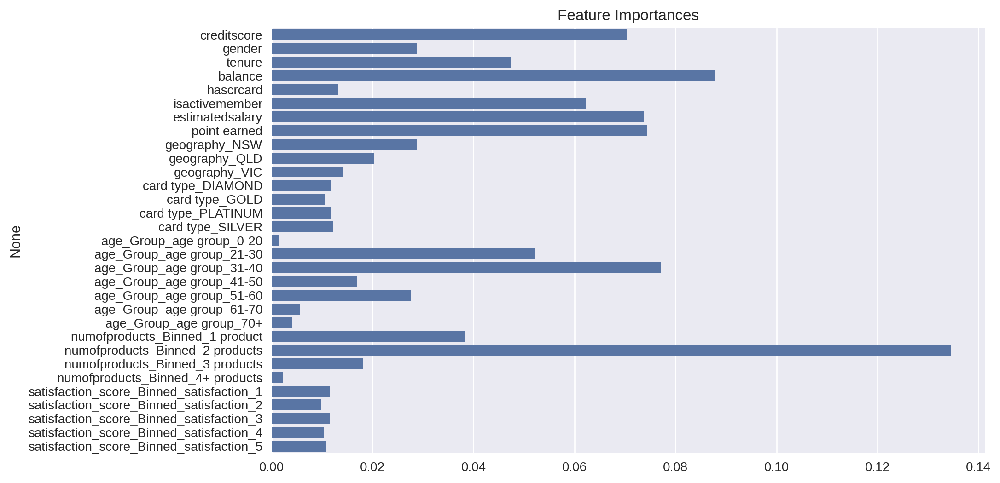

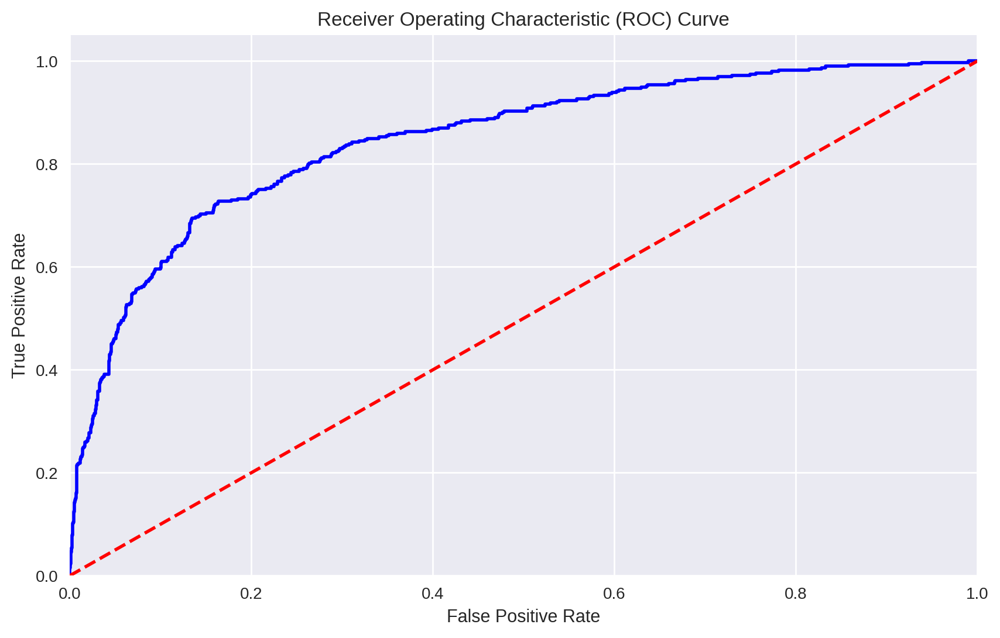

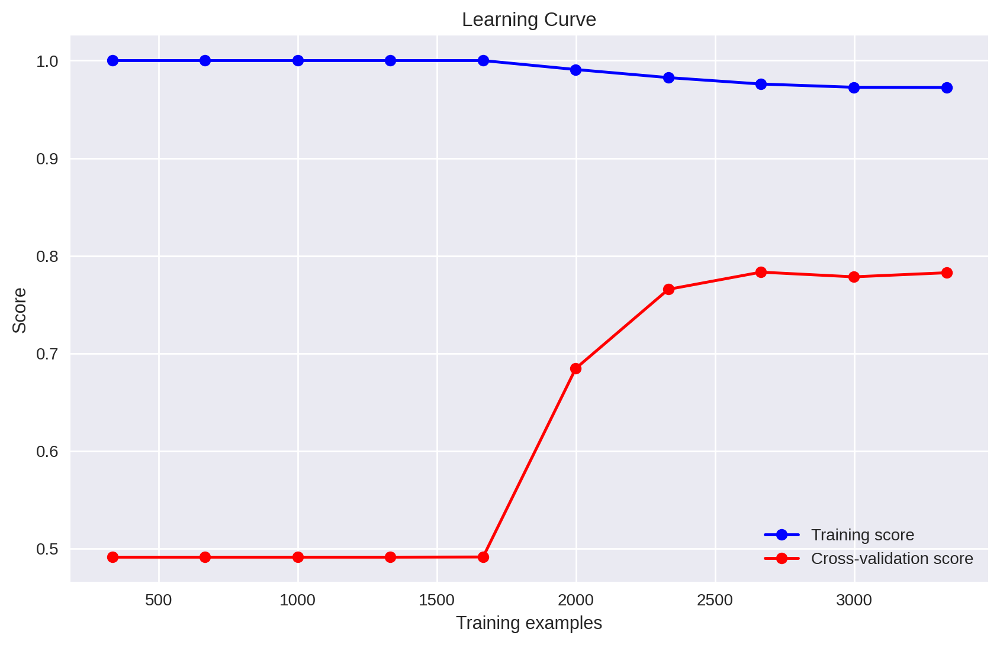

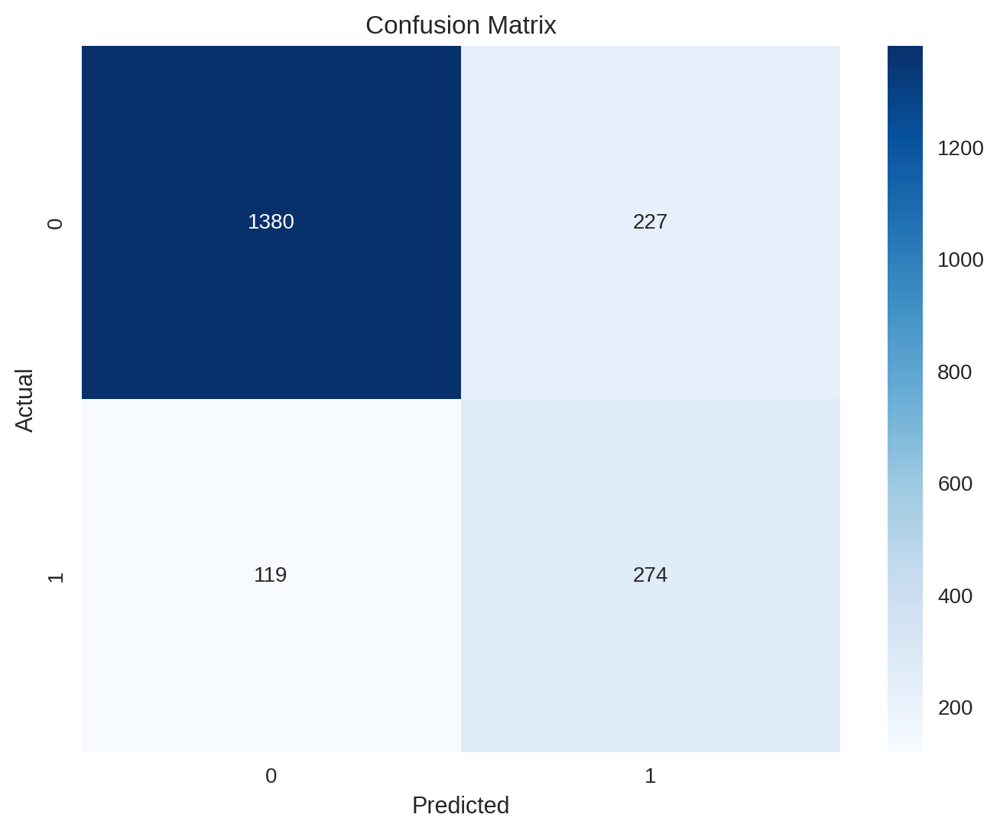

In [62]:
from sklearn.model_selection import GridSearchCV

scaler = StandardScaler()
# Fit and transform the balance and estimated_salary fields
df[['balance', 'estimatedsalary','creditscore']] = scaler.fit_transform(df[['balance', 'estimatedsalary','creditscore']])

# Split the data into features and target variable
X = df.drop(['exited', 'complain','age','numofproducts','satisfaction score'], axis=1)
y = df['exited']

# Standardize the numerical features before splitting the data
#numerical_features = X.select_dtypes(include=[np.number]).columns.tolist()
#scaler = StandardScaler()
#X[numerical_features] = scaler.fit_transform(X[numerical_features])

# Handle class imbalance using SMOTE
#smote = SMOTE(random_state=42)
#X_res, y_res = smote.fit_resample(X, y)
 
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


# Apply SMOTE to the training data
smote = SMOTE(sampling_strategy=0.4, k_neighbors=5, random_state=45)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Apply CNN to the SMOTE-resampled data
cnn = CondensedNearestNeighbour(n_neighbors=1)
X_train_res, y_train_res = cnn.fit_resample(X_train_smote, y_train_smote)

# Define the parameter grid
param_grid = {
    'n_estimators': [200],
    'max_depth': [None ],
    'min_samples_split': [2 ],
    'min_samples_leaf': [2]
}

# Create a Random Forest Classifier with the parameter grid
rf_clf = RandomForestClassifier(class_weight='balanced', random_state=42)

# Instantiate the grid search model
grid_search = GridSearchCV(estimator=rf_clf, param_grid=param_grid, cv=3,n_jobs=-1, verbose=2)

# Fit the grid search to the data
grid_search.fit(X_train_res, y_train_res)

# Get the best parameters
best_params_rf = grid_search.best_params_

print(f'Best parameters for Random Forest: {best_params_rf}')

# Train the model with best parameters
best_grid = grid_search.best_estimator_
best_grid.fit(X_train_res, y_train_res)

# Predict the response for the test dataset
y_pred = best_grid.predict(X_test)

# Create a confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Print evaluation metrics
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))
print("Precision:", metrics.precision_score(y_test, y_pred))
print("Recall:", metrics.recall_score(y_test, y_pred))
print("F1 score:", metrics.f1_score(y_test, y_pred))
# Feature importance
feature_importances = best_grid.feature_importances_
features = X.columns

plt.figure(figsize=(10,6))
sns.barplot(x=feature_importances, y=features)
plt.title('Feature Importances')
plt.show()

# ROC/AUC curve
y_pred_proba = best_grid.predict_proba(X_test)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)

plt.figure(figsize=(10,6))
plt.plot(fpr, tpr, color='blue', lw=2)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.show()

print(f'ROC AUC: {roc_auc}')

# Learning curve
train_sizes, train_scores, test_scores = learning_curve(best_grid,
                                                        X_train_res, 
                                                        y_train_res,
                                                        cv=3,
                                                        n_jobs=-1,
                                                        train_sizes=np.linspace(0.1, 1.0, 10))

train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

plt.figure(figsize=(10,6))
plt.plot(train_sizes, train_scores_mean, 'o-', color='blue', label='Training score')
plt.plot(train_sizes, test_scores_mean, 'o-', color='red', label='Cross-validation score')
plt.xlabel('Training examples')
plt.ylabel('Score')
plt.title('Learning Curve')
plt.legend(loc='best')
plt.show()

# Confusion matrix visualization
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# SMOTE + CNN with Hyperparameter tuning for a GBM model

[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.6s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.6s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.6s
Fitting 3 folds for each of 1 candidates, totalling 3 fits
Best parameters for GBM: {'learning_rate': 0.4, 'max_depth': 5, 'max_features': 'sqrt', 'min_samples_leaf': 10, 'min_samples_split': 5, 'n_estimators': 49, 'subsample': 0.9}
Accuracy: 0.807
Precision: 0.5064220183486239
Recall: 0.7022900763358778
F1 score: 0.5884861407249466
ROC AUC: 0.8304143291673991


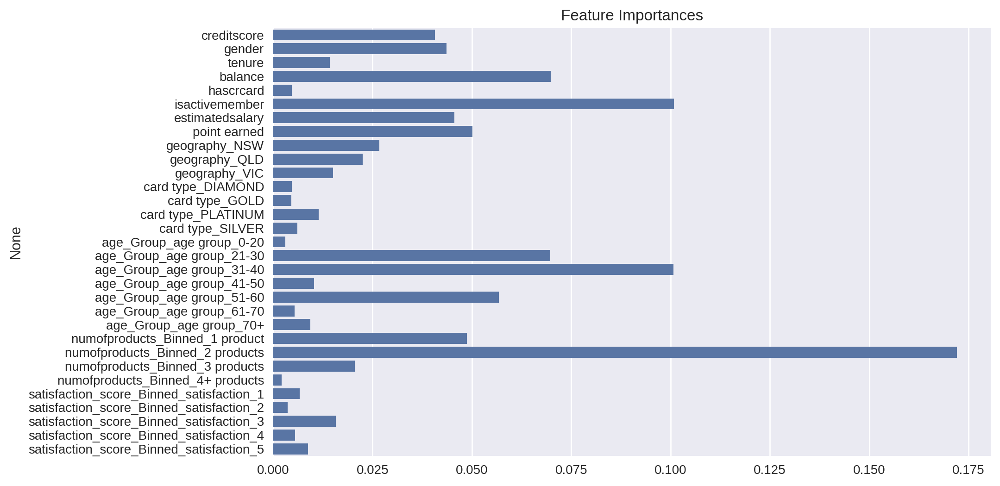

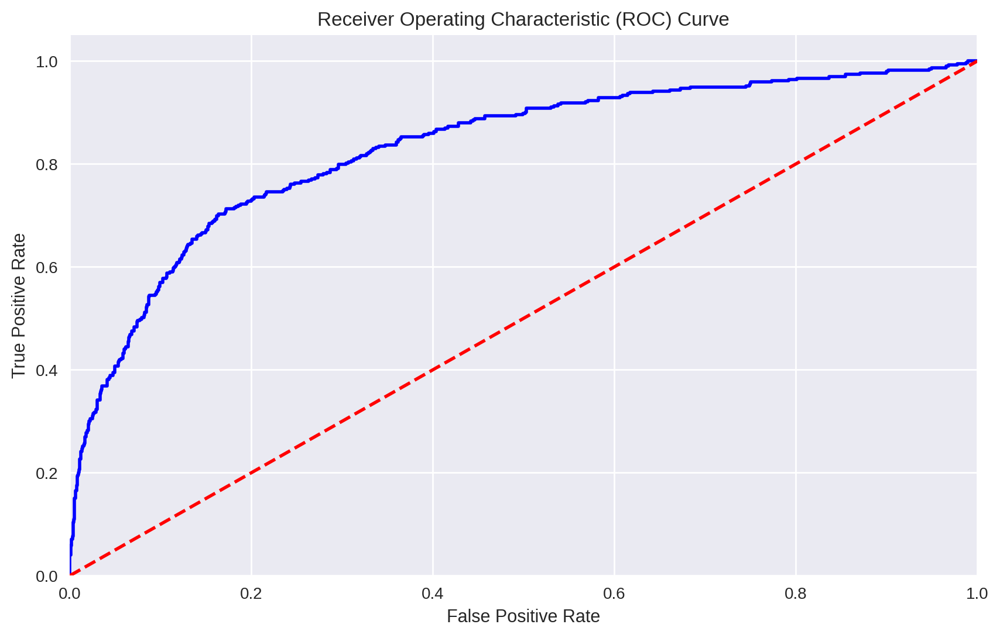

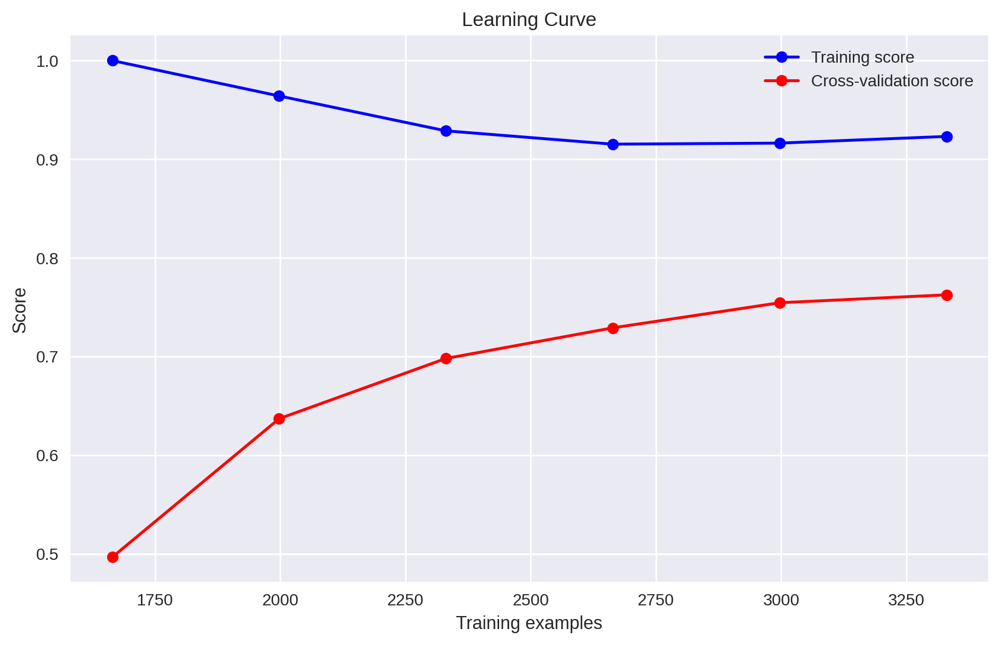

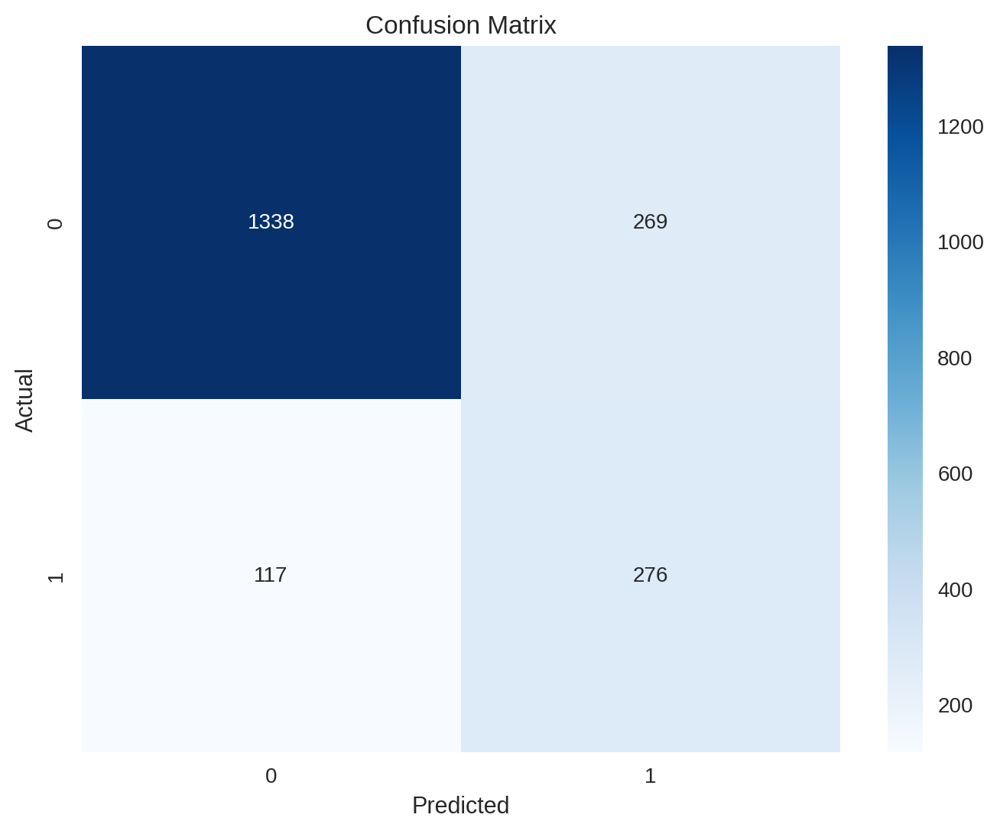

In [63]:
scaler = StandardScaler()
# Fit and transform the balance and estimated_salary fields
df[['balance', 'estimatedsalary','creditscore']] = scaler.fit_transform(df[['balance', 'estimatedsalary','creditscore']])

# Split the data into features and target variable
X = df.drop(['exited', 'complain','age','numofproducts','satisfaction score'], axis=1)
y = df['exited']

# Standardize the numerical features before splitting the data
#numerical_features = X.select_dtypes(include=[np.number]).columns.tolist()
#scaler = StandardScaler()
#X[numerical_features] = scaler.fit_transform(X[numerical_features])

# Handle class imbalance using SMOTE
#smote = SMOTE(random_state=42)
#X_res, y_res = smote.fit_resample(X, y)
 
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


# Apply SMOTE to the training data
smote = SMOTE(sampling_strategy=0.4, k_neighbors=5, random_state=45)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Apply CNN to the SMOTE-resampled data
cnn = CondensedNearestNeighbour(n_neighbors=1)
X_train_res, y_train_res = cnn.fit_resample(X_train_smote, y_train_smote)

# Define the parameter grid
param_grid = {
   'n_estimators': [49],
    'learning_rate': [0.4],
       'max_depth': [5],
    'min_samples_split': [5],
    'min_samples_leaf': [10],
     'subsample': [0.9],
    'max_features': ['sqrt']

}

# Create a GBM Classifier with the parameter grid
gbm_clf = GradientBoostingClassifier(random_state=42)

# Instantiate the grid search model
grid_search = GridSearchCV(estimator=gbm_clf, param_grid=param_grid, cv=3,n_jobs=-1, verbose=2)

# Fit the grid search to the data
grid_search.fit(X_train_res, y_train_res)

# Get the best parameters
best_params_gbm = grid_search.best_params_

print(f'Best parameters for GBM: {best_params_gbm}')

# Train the model with best parameters
best_grid = grid_search.best_estimator_
best_grid.fit(X_train_res, y_train_res)

# Predict the response for the test dataset
y_pred = best_grid.predict(X_test)

# Create a confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Print evaluation metrics
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))
print("Precision:", metrics.precision_score(y_test, y_pred))
print("Recall:", metrics.recall_score(y_test, y_pred))
print("F1 score:", metrics.f1_score(y_test, y_pred))

# Feature importance
feature_importances = best_grid.feature_importances_
features = X.columns

plt.figure(figsize=(10,6))
sns.barplot(x=feature_importances, y=features)
plt.title('Feature Importances')
plt.show()

# ROC/AUC curve
y_pred_proba = best_grid.predict_proba(X_test)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)

plt.figure(figsize=(10,6))
plt.plot(fpr, tpr, color='blue', lw=2)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.show()

print(f'ROC AUC: {roc_auc}')

# Learning curve
train_sizes, train_scores, test_scores = learning_curve(best_grid,
                                                        X_train_res, y_train_res,
                                                        cv=3,
                                                        n_jobs=-1,
                                                        train_sizes=np.linspace(0.1, 1.0, 10))

train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

plt.figure(figsize=(10,6))
plt.plot(train_sizes, train_scores_mean, 'o-', color='blue', label='Training score')
plt.plot(train_sizes, test_scores_mean, 'o-', color='red', label='Cross-validation score')
plt.xlabel('Training examples')
plt.ylabel('Score')
plt.title('Learning Curve')
plt.legend(loc='best')
plt.show()

# Confusion matrix visualization
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# DecisionTreeClassifier- TomekLinks

Fitting 3 folds for each of 216 candidates, totalling 648 fits
[CV] END learning_rate=0.4, max_depth=5, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=49, subsample=0.9; total time=   0.2s
[CV] END max_depth=0, min_samples_leaf=0, min_samples_split=1; total time=   0.0s
[CV] END max_depth=0, min_samples_leaf=0, min_samples_split=2; total time=   0.0s
[CV] END max_depth=0, min_samples_leaf=0, min_samples_split=4; total time=   0.0s
[CV] END max_depth=0, min_samples_leaf=0, min_samples_split=4; total time=   0.0s
[CV] END max_depth=0, min_samples_leaf=1, min_samples_split=0; total time=   0.0s
[CV] END max_depth=0, min_samples_leaf=1, min_samples_split=1; total time=   0.0s
[CV] END max_depth=0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=0, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END max_depth=0, min_samples_leaf=1, min_

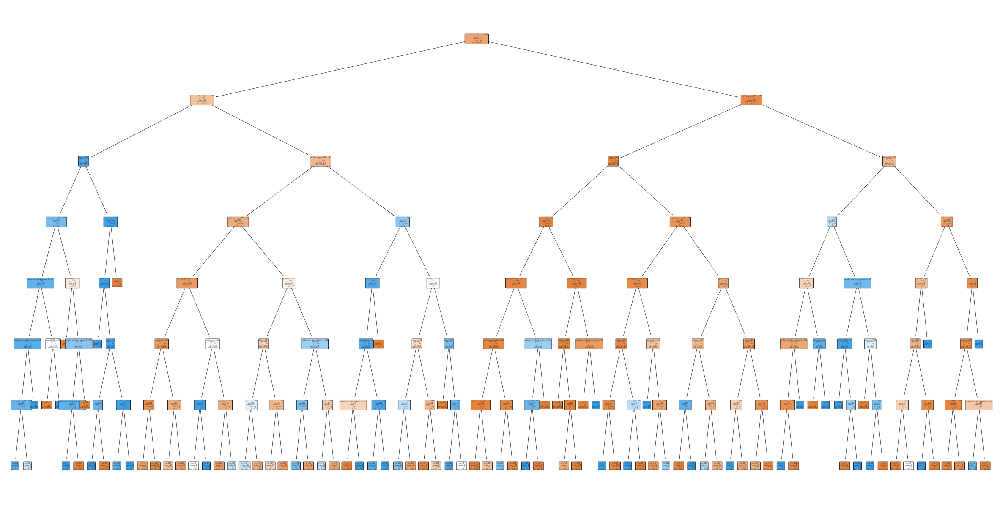

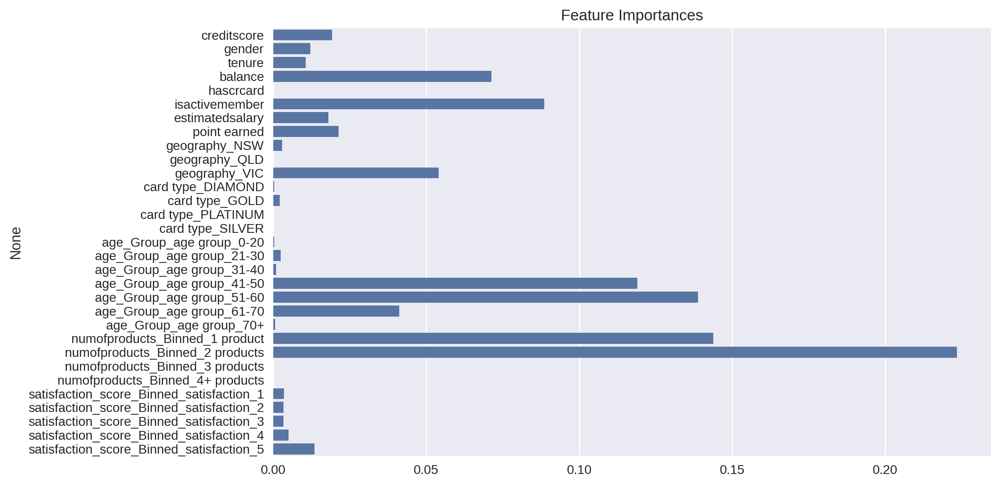

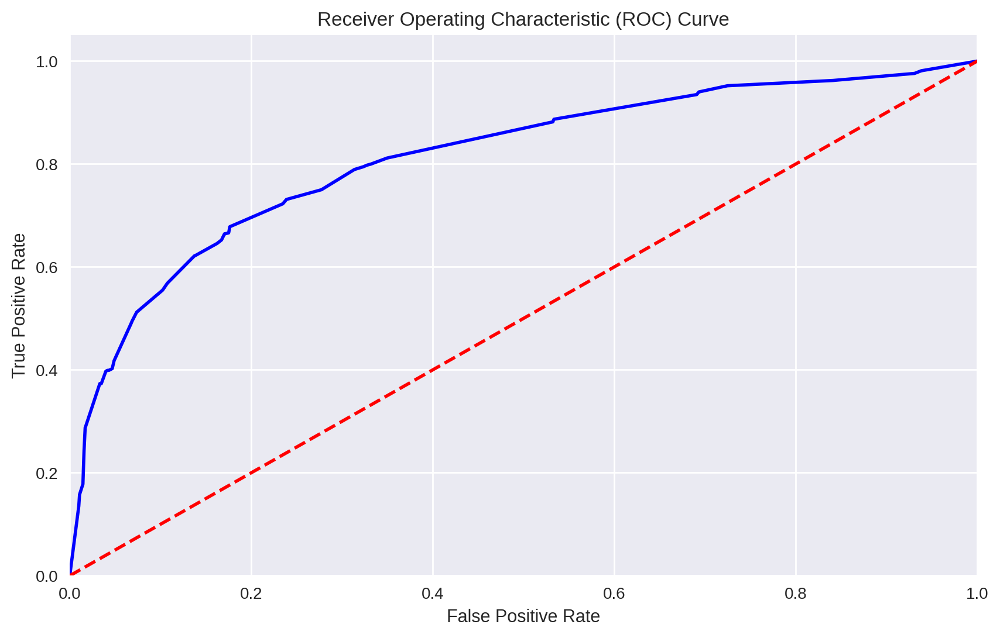

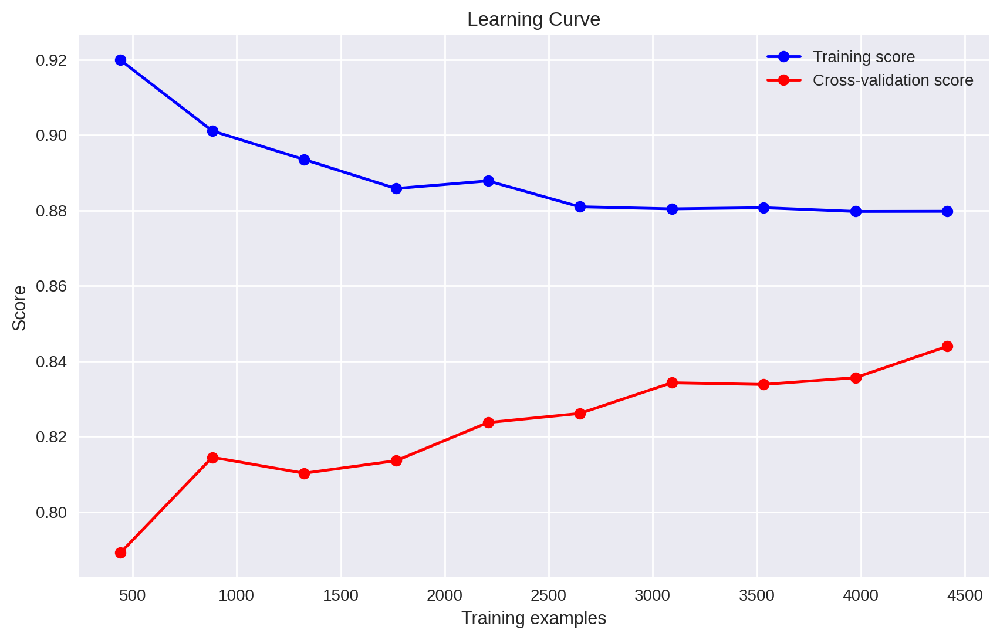

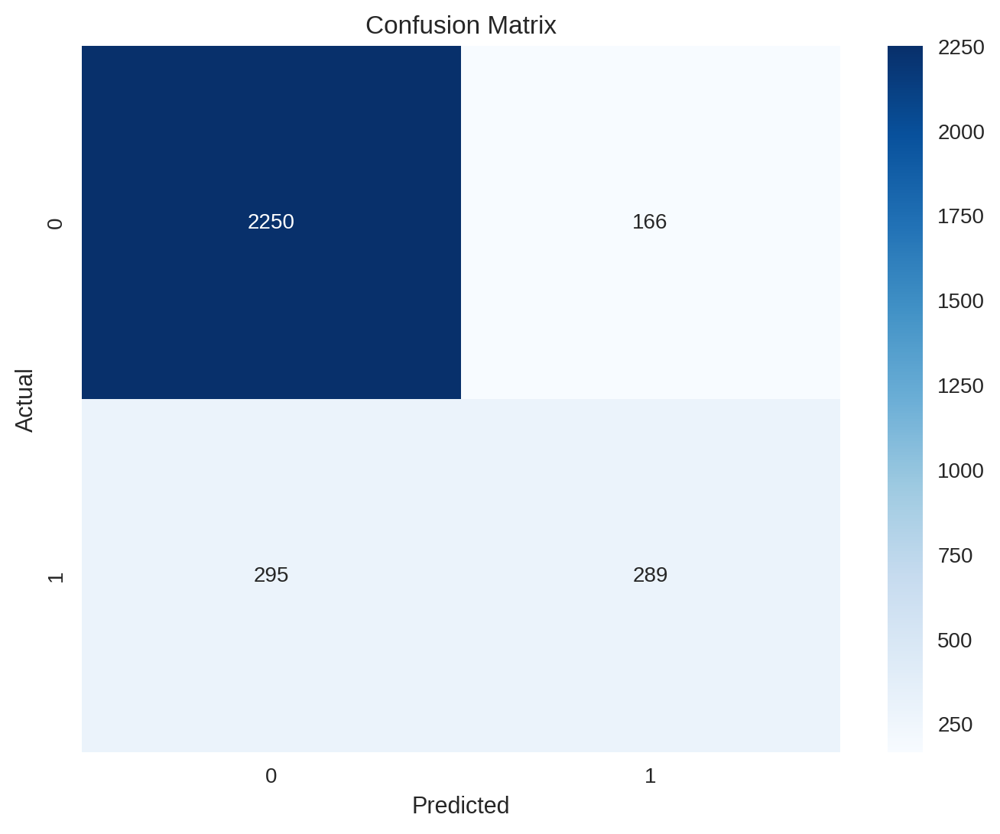

In [64]:
from imblearn.under_sampling import TomekLinks
X = df.drop(['exited', 'complain','age','numofproducts','satisfaction score'], axis=1)
y = df['exited']
# Standardize the numerical features before splitting the data
numerical_features = X.select_dtypes(include=[np.number]).columns.tolist()
scaler = StandardScaler()
X[numerical_features] = scaler.fit_transform(X[numerical_features])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

tl = TomekLinks(sampling_strategy='majority', n_jobs=-1)
X_res, y_res = tl.fit_resample(X_train, y_train)

param_grid = {
    'max_depth': np.arange(9),
    'min_samples_split': np.arange(6),
    'min_samples_leaf': np.arange(4),
}

clf = DecisionTreeClassifier(random_state=42)
grid_search = GridSearchCV(estimator = clf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)

grid_search.fit(X_res, y_res)

grid_search.best_params_

# Train the model with best parameters
best_grid = grid_search.best_estimator_
best_grid.fit(X_res, y_res)

# Visualise the decision tree
plt.figure(figsize=(15,7.5))
plot_tree(best_grid, filled=True, rounded=True,
          feature_names=X.columns,
          class_names=['Not Exited','Exited'])
plt.show()

# Predict the response for the test dataset
y_pred = best_grid.predict(X_test)

# Create a confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Print evaluation metrics
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))
print("Precision:", metrics.precision_score(y_test, y_pred))
print("Recall:", metrics.recall_score(y_test, y_pred))
print("F1 score:", metrics.f1_score(y_test, y_pred))

# Feature importance
feature_importances = best_grid.feature_importances_
features = X.columns

plt.figure(figsize=(10,6))
sns.barplot(x=feature_importances, y=features)
plt.title('Feature Importances')
plt.show()

# ROC/AUC curve
y_pred_proba = best_grid.predict_proba(X_test)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)

plt.figure(figsize=(10,6))
plt.plot(fpr, tpr, color='blue', lw=2)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.show()

print(f'ROC AUC: {roc_auc}')

# Learning curve
train_sizes, train_scores, test_scores = learning_curve(best_grid,
                                                        X_res, y_res,
                                                        cv=3,
                                                        n_jobs=-1,
                                                        train_sizes=np.linspace(0.1, 1.0, 10))

train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

plt.figure(figsize=(10,6))
plt.plot(train_sizes, train_scores_mean, 'o-', color='blue', label='Training score')
plt.plot(train_sizes, test_scores_mean, 'o-', color='red', label='Cross-validation score')
plt.xlabel('Training examples')
plt.ylabel('Score')
plt.title('Learning Curve')
plt.legend(loc='best')
plt.show()

# Confusion matrix visualization
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()




# RandomForestClassifier-TomekLinks

Fitting 3 folds for each of 1 candidates, totalling 3 fits
Best parameters for Random Forest: {'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}
Accuracy: 0.85
Precision: 0.6218181818181818
Recall: 0.5856164383561644
F1 score: 0.6031746031746031
ROC AUC: 0.8494610700353805


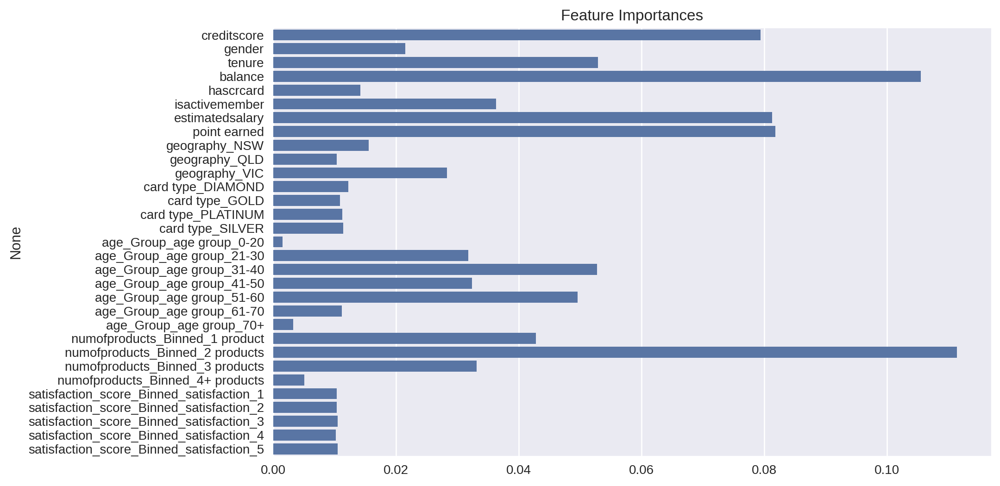

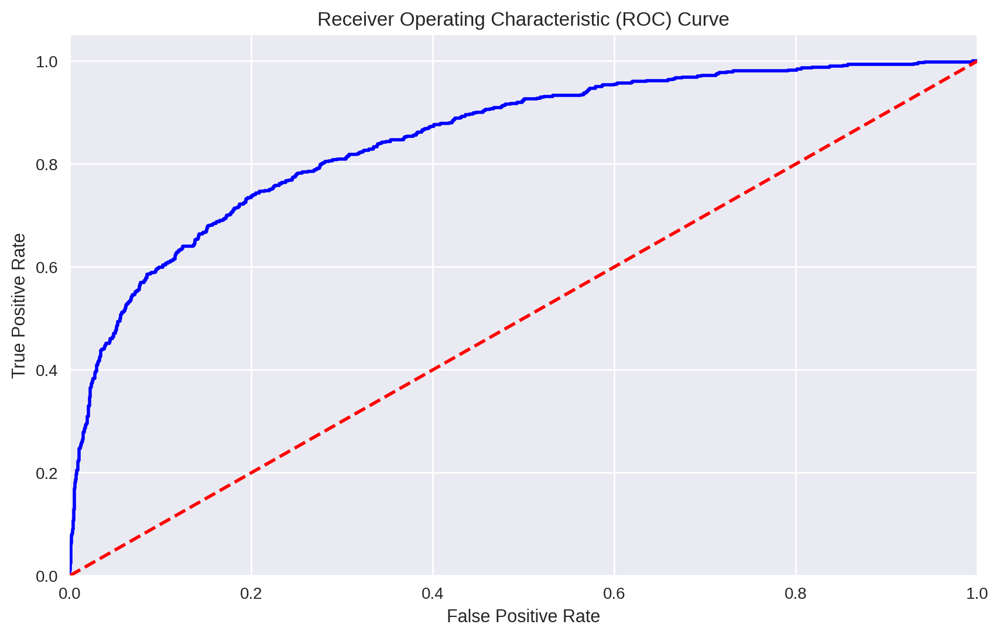

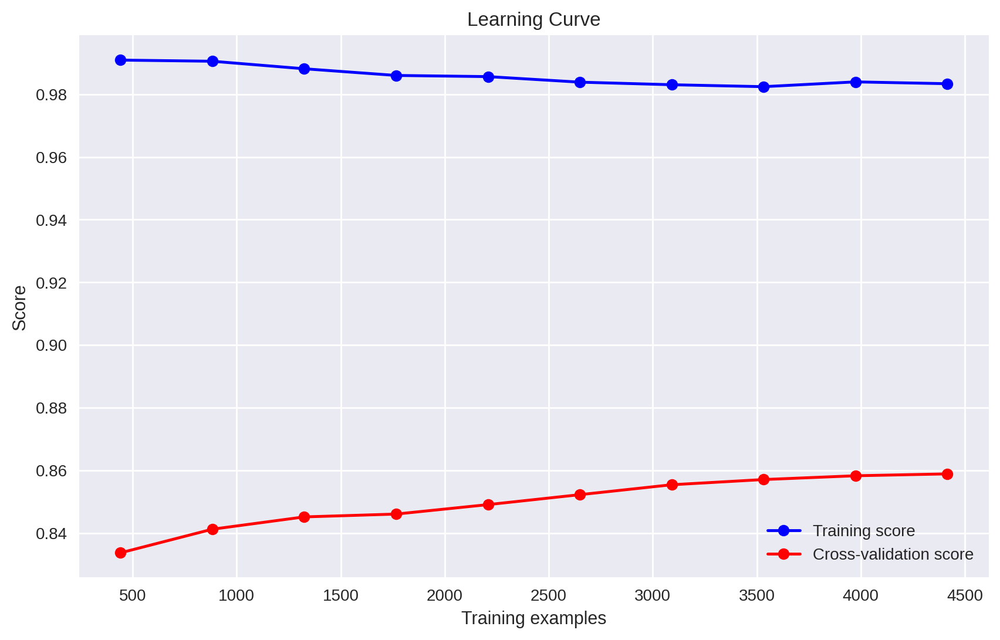

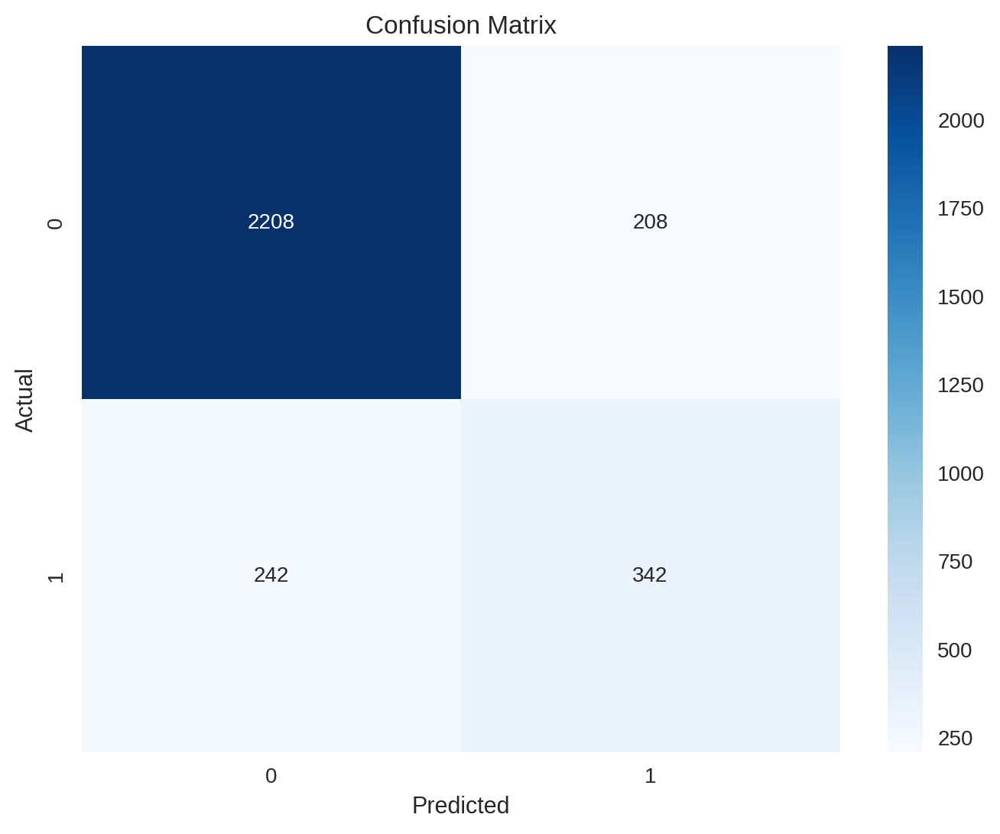

In [24]:
from sklearn.model_selection import GridSearchCV
from imblearn.under_sampling import TomekLinks
X = df.drop(['exited', 'complain','age','numofproducts','satisfaction score'], axis=1)
y = df['exited']
# Standardize the numerical features before splitting the data
numerical_features = X.select_dtypes(include=[np.number]).columns.tolist()
scaler = StandardScaler()
X[numerical_features] = scaler.fit_transform(X[numerical_features])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

tl = TomekLinks(sampling_strategy='majority', n_jobs=-1)
X_res, y_res = tl.fit_resample(X_train, y_train)
# Define the parameter grid
param_grid = {
    'n_estimators': [200],
    'max_depth': [None],
    'min_samples_split': [2],
    'min_samples_leaf': [2]
}

# Create a Random Forest Classifier with the parameter grid
rf_clf = RandomForestClassifier(class_weight='balanced', random_state=42)

# Instantiate the grid search model
grid_search = GridSearchCV(estimator=rf_clf, param_grid=param_grid, cv=3,n_jobs=-1, verbose=2)

# Fit the grid search to the data
grid_search.fit(X_res, y_res)

# Get the best parameters
best_params_rf = grid_search.best_params_

print(f'Best parameters for Random Forest: {best_params_rf}')

# Train the model with best parameters
best_grid = grid_search.best_estimator_
best_grid.fit(X_res, y_res)

# Predict the response for the test dataset
y_pred = best_grid.predict(X_test)

# Create a confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Print evaluation metrics
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))
print("Precision:", metrics.precision_score(y_test, y_pred))
print("Recall:", metrics.recall_score(y_test, y_pred))
print("F1 score:", metrics.f1_score(y_test, y_pred))
# Feature importance
feature_importances = best_grid.feature_importances_
features = X.columns

plt.figure(figsize=(10,6))
sns.barplot(x=feature_importances, y=features)
plt.title('Feature Importances')
plt.show()

# ROC/AUC curve
y_pred_proba = best_grid.predict_proba(X_test)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)

plt.figure(figsize=(10,6))
plt.plot(fpr, tpr, color='blue', lw=2)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.show()

print(f'ROC AUC: {roc_auc}')

# Learning curve
train_sizes, train_scores, test_scores = learning_curve(best_grid,
                                                        X_res, y_res,
                                                        cv=3,
                                                        n_jobs=-1,
                                                        train_sizes=np.linspace(0.1, 1.0, 10))

train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

plt.figure(figsize=(10,6))
plt.plot(train_sizes, train_scores_mean, 'o-', color='blue', label='Training score')
plt.plot(train_sizes, test_scores_mean, 'o-', color='red', label='Cross-validation score')
plt.xlabel('Training examples')
plt.ylabel('Score')
plt.title('Learning Curve')
plt.legend(loc='best')
plt.show()

# Confusion matrix visualization
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

TomekLinks +GBM

Fitting 3 folds for each of 1 candidates, totalling 3 fits
Best parameters for GBM: {'learning_rate': 0.4, 'max_depth': 5, 'max_features': 'sqrt', 'min_samples_leaf': 10, 'min_samples_split': 5, 'n_estimators': 49, 'subsample': 0.9}
Accuracy: 0.8496666666666667
Precision: 0.639412997903564
Recall: 0.5222602739726028
F1 score: 0.5749293119698398
ROC AUC: 0.8417173183343919


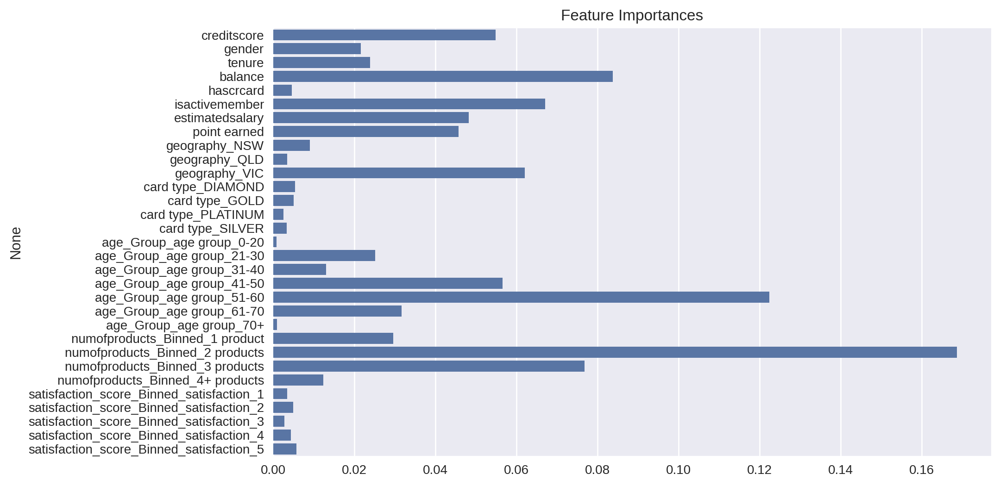

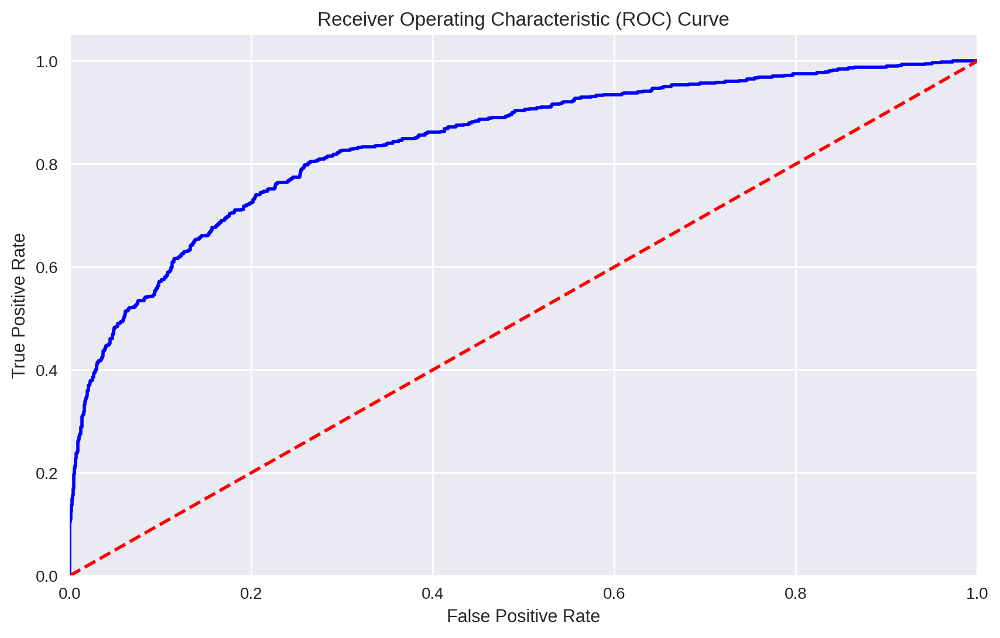

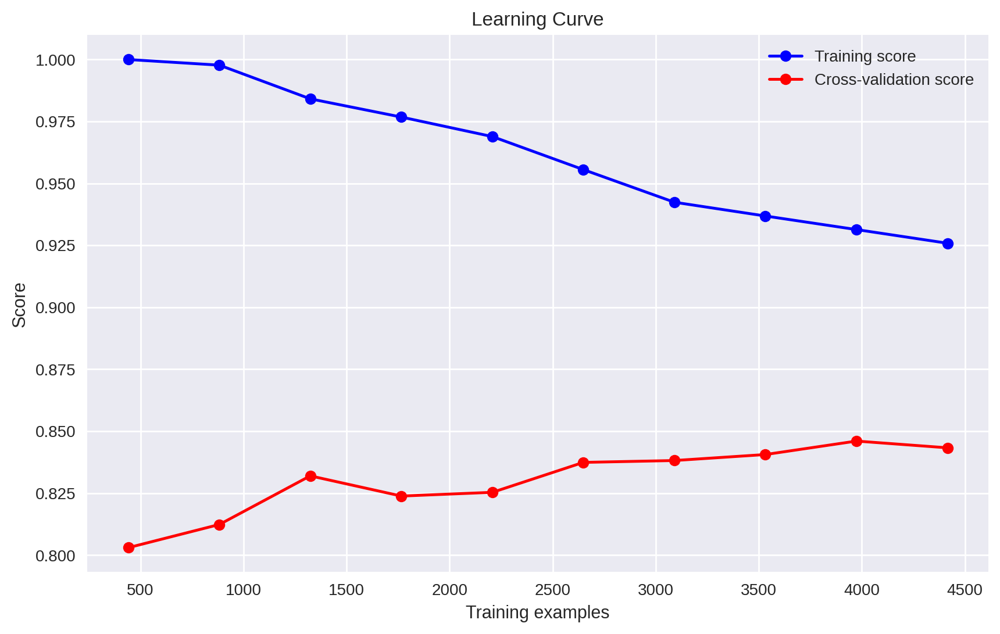

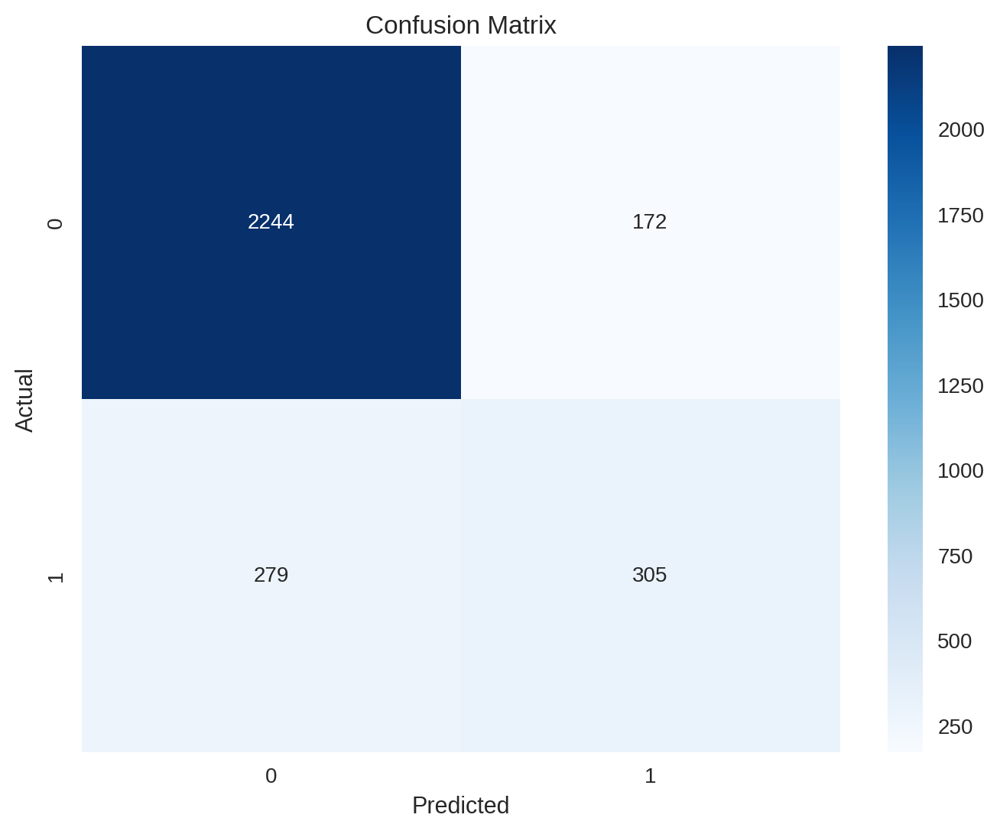

In [66]:
from sklearn.model_selection import GridSearchCV
from imblearn.under_sampling import TomekLinks
X = df.drop(['exited', 'complain','age','numofproducts','satisfaction score'], axis=1)
y = df['exited']
# Standardize the numerical features before splitting the data
numerical_features = X.select_dtypes(include=[np.number]).columns.tolist()
scaler = StandardScaler()
X[numerical_features] = scaler.fit_transform(X[numerical_features])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

tl = TomekLinks(sampling_strategy='majority', n_jobs=-1)
X_res, y_res = tl.fit_resample(X_train, y_train)
# Define the parameter grid
param_grid = {
    'n_estimators': [49],
    'learning_rate': [0.4],
       'max_depth': [5],
    'min_samples_split': [5],
    'min_samples_leaf': [10],
     'subsample': [0.9],
    'max_features': ['sqrt']
}

# Create a GBM Classifier with the parameter grid
gbm_clf = GradientBoostingClassifier(random_state=42)

# Instantiate the grid search model
grid_search = GridSearchCV(estimator=gbm_clf, param_grid=param_grid, cv=3,n_jobs=-1, verbose=2)

# Fit the grid search to the data
grid_search.fit(X_res, y_res)

# Get the best parameters
best_params_gbm = grid_search.best_params_

print(f'Best parameters for GBM: {best_params_gbm}')

# Train the model with best parameters
best_grid = grid_search.best_estimator_
best_grid.fit(X_res, y_res)

# Predict the response for the test dataset
y_pred = best_grid.predict(X_test)

# Create a confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Print evaluation metrics
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))
print("Precision:", metrics.precision_score(y_test, y_pred))
print("Recall:", metrics.recall_score(y_test, y_pred))
print("F1 score:", metrics.f1_score(y_test, y_pred))

# Feature importance
feature_importances = best_grid.feature_importances_
features = X.columns

plt.figure(figsize=(10,6))
sns.barplot(x=feature_importances, y=features)
plt.title('Feature Importances')
plt.show()

# ROC/AUC curve
y_pred_proba = best_grid.predict_proba(X_test)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)

plt.figure(figsize=(10,6))
plt.plot(fpr, tpr, color='blue', lw=2)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.show()

print(f'ROC AUC: {roc_auc}')

# Learning curve
train_sizes, train_scores, test_scores = learning_curve(best_grid,
                                                        X_res, y_res,
                                                        cv=3,
                                                        n_jobs=-1,
                                                        train_sizes=np.linspace(0.1, 1.0, 10))

train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

plt.figure(figsize=(10,6))
plt.plot(train_sizes, train_scores_mean, 'o-', color='blue', label='Training score')
plt.plot(train_sizes, test_scores_mean, 'o-', color='red', label='Cross-validation score')
plt.xlabel('Training examples')
plt.ylabel('Score')
plt.title('Learning Curve')
plt.legend(loc='best')
plt.show()

# Confusion matrix visualization
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


# OneSidedSelection + GBM

Fitting 3 folds for each of 1 candidates, totalling 3 fits
Best parameters for GBM: {'learning_rate': 0.1, 'max_depth': 5, 'max_features': 'sqrt', 'min_samples_leaf': 10, 'min_samples_split': 2, 'n_estimators': 49, 'subsample': 0.9}
Accuracy: 0.8613333333333333
Precision: 0.6802575107296137
Recall: 0.5428082191780822
F1 score: 0.6038095238095238
ROC AUC: 0.8544718996643382
Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.94      0.92      2416
           1       0.68      0.54      0.60       584

    accuracy                           0.86      3000
   macro avg       0.79      0.74      0.76      3000
weighted avg       0.85      0.86      0.86      3000



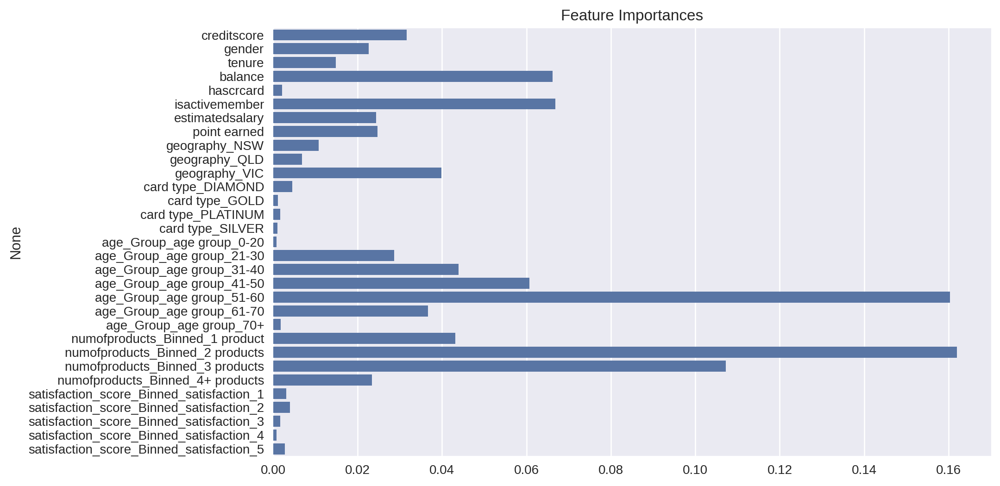

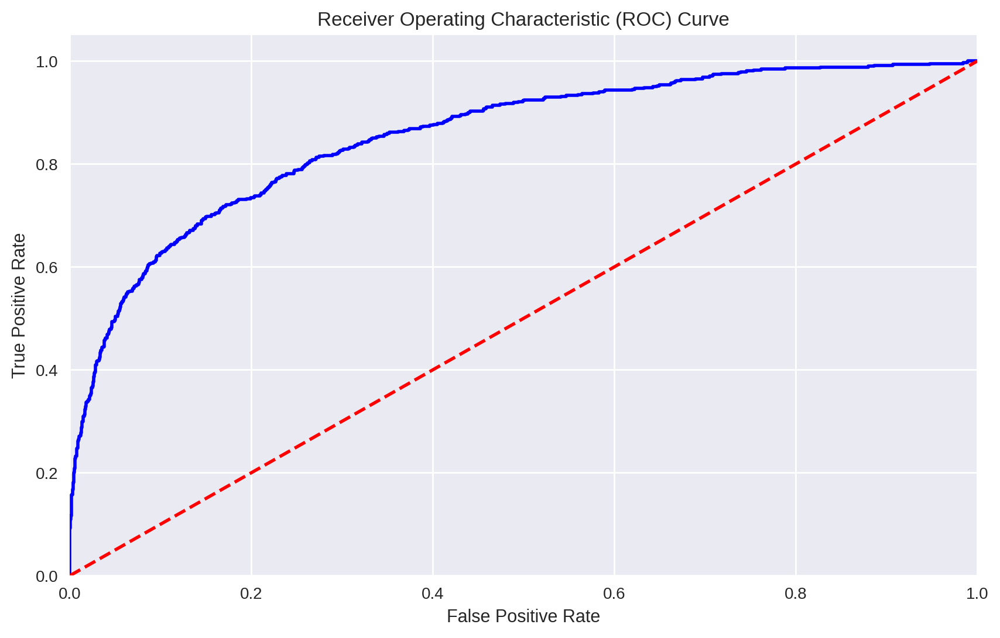

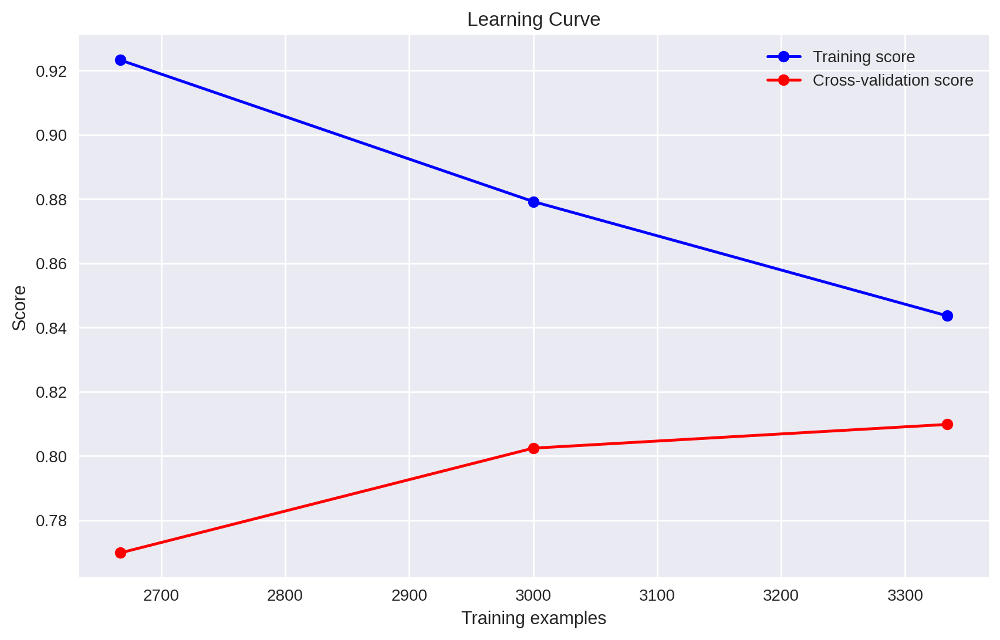

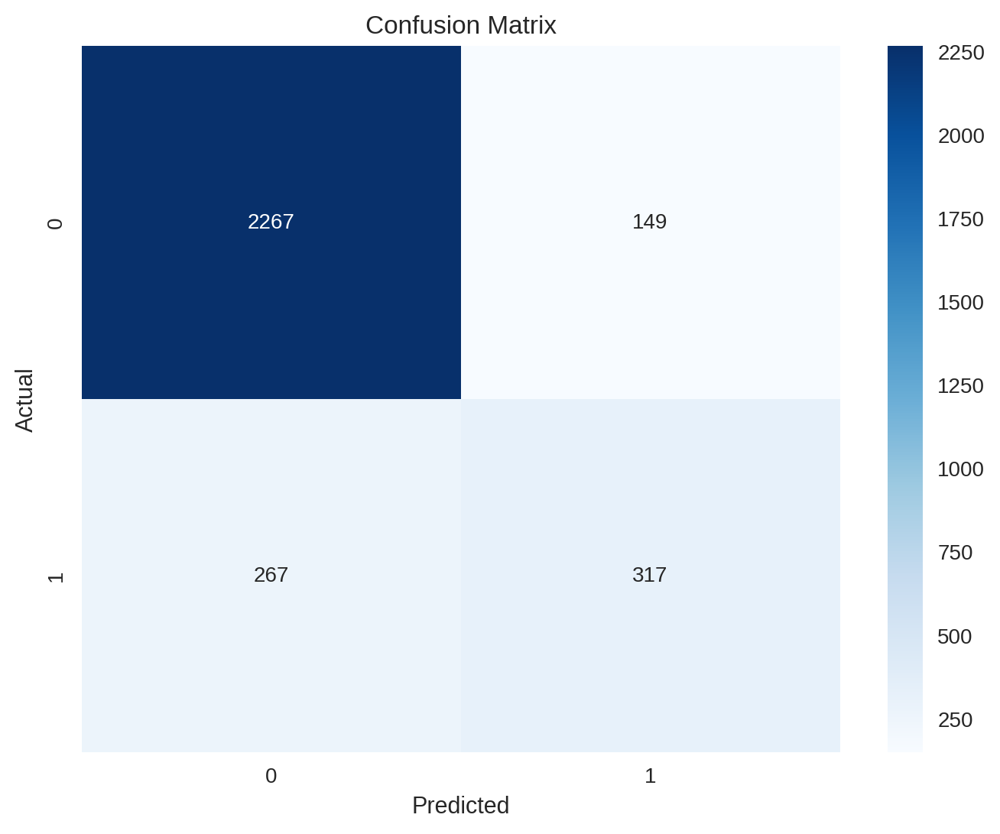

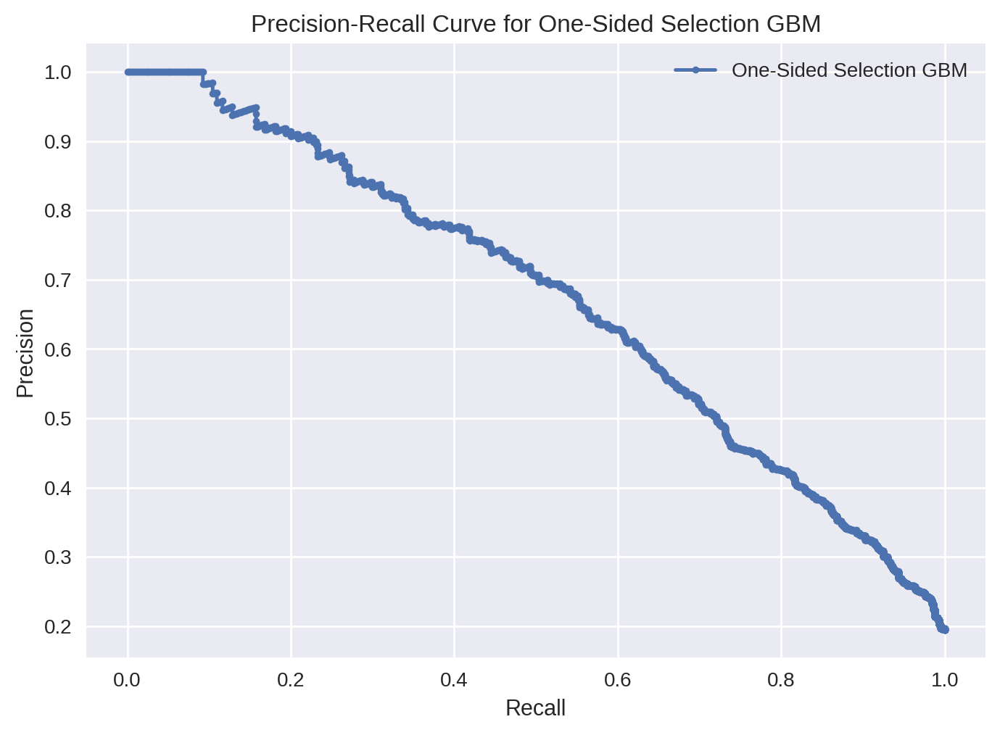

In [27]:
from sklearn.model_selection import GridSearchCV
from imblearn.under_sampling import OneSidedSelection
from sklearn.metrics import confusion_matrix, roc_curve, roc_auc_score, classification_report, precision_recall_curve

scaler = StandardScaler()
# Fit and transform the balance and estimated_salary fields
df[['balance', 'estimatedsalary']] = scaler.fit_transform(df[['balance', 'estimatedsalary']])
X = df.drop(['exited', 'complain','age','numofproducts','satisfaction score'], axis=1)
y = df['exited']
# Standardize the numerical features before splitting the data
#numerical_features = X.select_dtypes(include=[np.number]).columns.tolist()
#scaler = StandardScaler()
#X[numerical_features] = scaler.fit_transform(X[numerical_features])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

oss_sample = OneSidedSelection(n_neighbors=1, n_seeds_S=500)
X_res, y_res = oss_sample.fit_resample(X_train, y_train)
# Define the parameter grid
param_grid = {
    'n_estimators': [49],
    'learning_rate': [0.1],
       'max_depth': [5],
    'min_samples_split': [2],
    'min_samples_leaf': [10],
    'subsample': [0.9 ],
    'max_features': ['sqrt']

}

# Create a GBM Classifier with the parameter grid
gbm_clf = GradientBoostingClassifier(random_state=42)

# Instantiate the grid search model
grid_search = GridSearchCV(estimator=gbm_clf, param_grid=param_grid, cv=3,n_jobs=-1, verbose=2)

# Fit the grid search to the data
grid_search.fit(X_res, y_res)

# Get the best parameters
best_params_gbm = grid_search.best_params_

print(f'Best parameters for GBM: {best_params_gbm}')

# Train the model with best parameters
best_grid = grid_search.best_estimator_
best_grid.fit(X_res, y_res)

# Predict the response for the test dataset
y_pred = best_grid.predict(X_test)

# Create a confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Print evaluation metrics
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))
print("Precision:", metrics.precision_score(y_test, y_pred))
print("Recall:", metrics.recall_score(y_test, y_pred))
print("F1 score:", metrics.f1_score(y_test, y_pred))

# Feature importance
feature_importances = best_grid.feature_importances_
features = X.columns

plt.figure(figsize=(10,6))
sns.barplot(x=feature_importances, y=features)
plt.title('Feature Importances')
plt.show()

# ROC/AUC curve
y_pred_proba = best_grid.predict_proba(X_test)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)

plt.figure(figsize=(10,6))
plt.plot(fpr, tpr, color='blue', lw=2)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.show()

print(f'ROC AUC: {roc_auc}')

# Learning curve
train_sizes, train_scores, test_scores = learning_curve(best_grid,
                                                        X_res, y_res,
                                                        cv=3,
                                                        n_jobs=-1,
                                                        train_sizes=np.linspace(0.1, 1.0, 10))

train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

plt.figure(figsize=(10,6))
plt.plot(train_sizes, train_scores_mean, 'o-', color='blue', label='Training score')
plt.plot(train_sizes, test_scores_mean, 'o-', color='red', label='Cross-validation score')
plt.xlabel('Training examples')
plt.ylabel('Score')
plt.title('Learning Curve')
plt.legend(loc='best')
plt.show()

# Confusion matrix visualization
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# Precision-Recall Curve and Classification Report

# Calculate precision-recall curve
precision_curve, recall_curve, _ = precision_recall_curve(y_test, y_pred_proba)

# Plot precision-recall curve
plt.figure()
plt.plot(recall_curve, precision_curve, marker='.', label='One-Sided Selection GBM')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve for One-Sided Selection GBM')
plt.legend()
plt.show()

# Print classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))


# RandomForestClassifier+OneSidedSelection

Best parameters for Random Forest: {'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 49}
Accuracy: 0.836
Precision: 0.5741935483870968
Recall: 0.6095890410958904
F1 score: 0.5913621262458472
ROC AUC: 0.8431932805270796


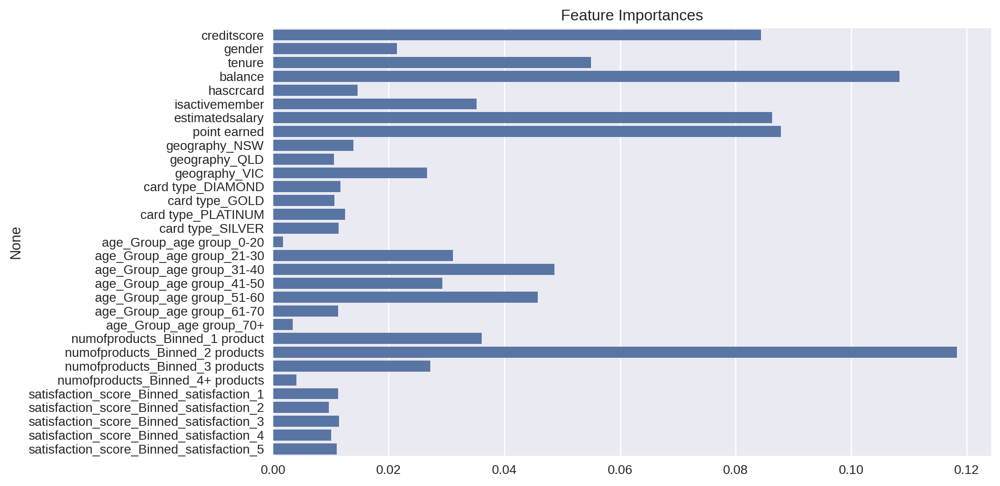

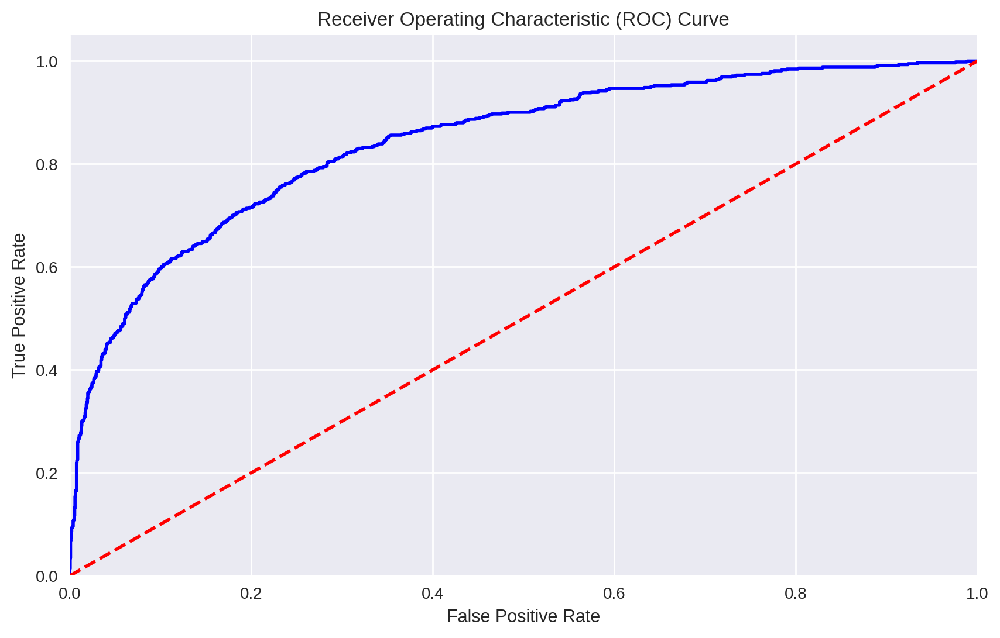

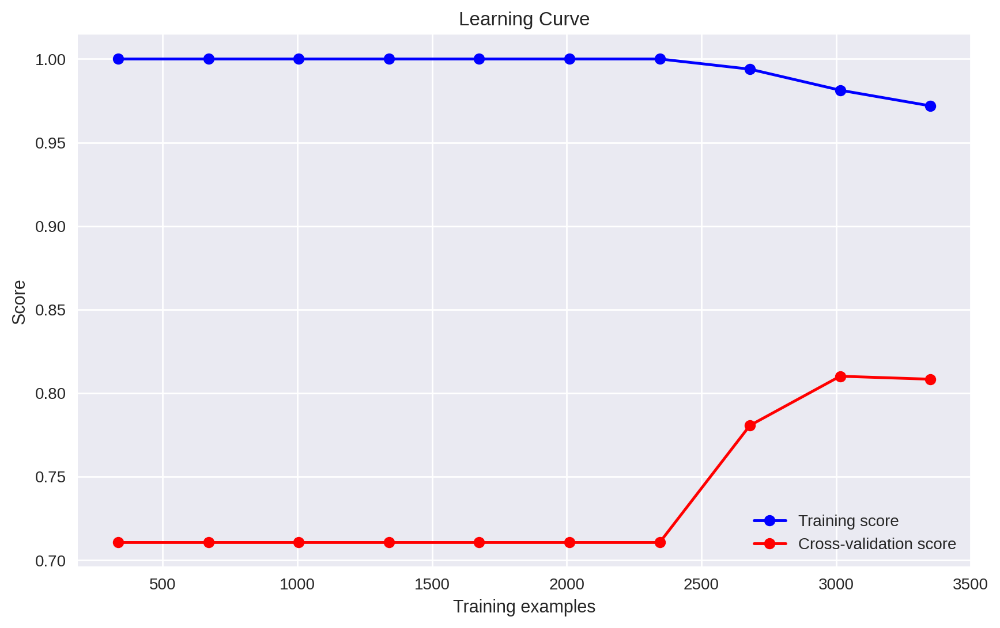

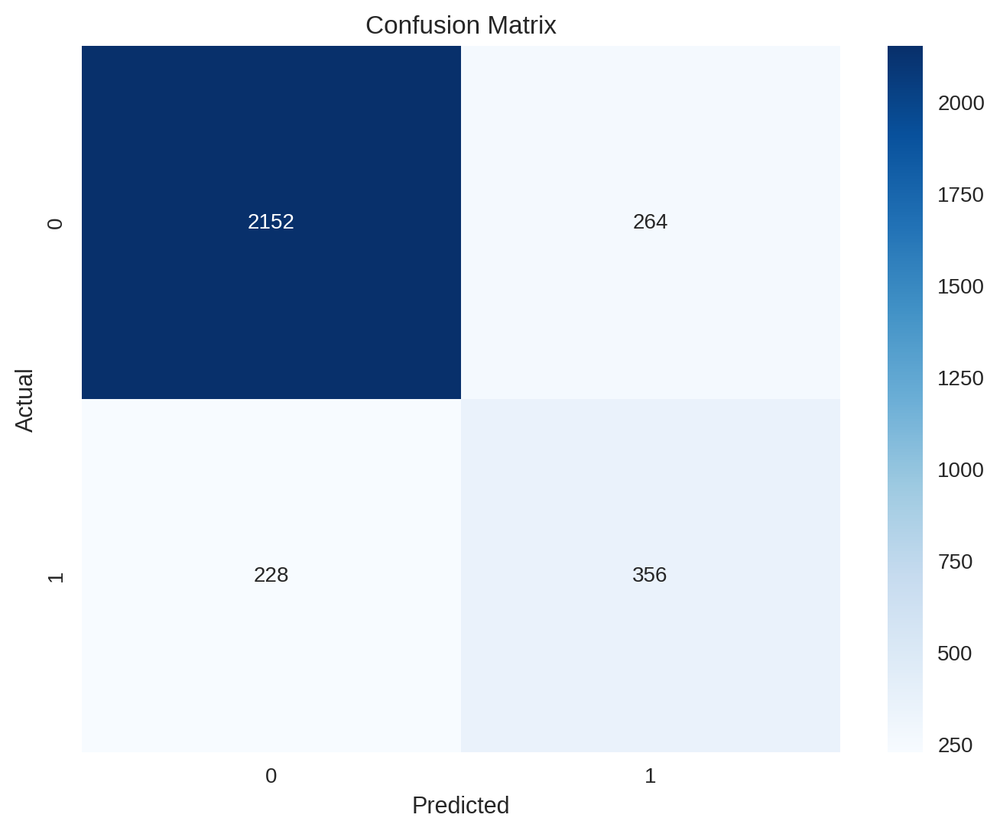

In [68]:
from sklearn.model_selection import GridSearchCV
from imblearn.under_sampling import OneSidedSelection

from sklearn.preprocessing import MinMaxScaler


scaler = StandardScaler()
# Fit and transform the balance and estimated_salary fields
df[['balance', 'estimatedsalary']] = scaler.fit_transform(df[['balance', 'estimatedsalary']])

X = df.drop(['exited', 'complain','age','numofproducts','satisfaction score'], axis=1)
y = df['exited']
# Standardize the numerical features before splitting the data
#numerical_features = X.select_dtypes(include=[np.number]).columns.tolist()
#scaler = StandardScaler()
#X[numerical_features] = scaler.fit_transform(X[numerical_features])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

oss_sample = OneSidedSelection(n_neighbors=1, n_seeds_S=500)
X_res, y_res = oss_sample.fit_resample(X_train, y_train)
# Define the parameter grid
param_grid = {
    'n_estimators': [49],
    'max_depth': [None],
    'min_samples_split': [2],
    'min_samples_leaf': [2]
}

# Create a Random Forest Classifier with the parameter grid
rf_clf = RandomForestClassifier(class_weight='balanced', random_state=42)

# Instantiate the grid search model
grid_search = GridSearchCV(estimator=rf_clf, param_grid=param_grid, cv=3)

# Fit the grid search to the data
grid_search.fit(X_res, y_res)

# Get the best parameters
best_params_rf = grid_search.best_params_

print(f'Best parameters for Random Forest: {best_params_rf}')

# Train the model with best parameters
best_grid = grid_search.best_estimator_
best_grid.fit(X_res, y_res)

# Predict the response for the test dataset
y_pred = best_grid.predict(X_test)

# Create a confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Print evaluation metrics
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))
print("Precision:", metrics.precision_score(y_test, y_pred))
print("Recall:", metrics.recall_score(y_test, y_pred))
print("F1 score:", metrics.f1_score(y_test, y_pred))
# Feature importance
feature_importances = best_grid.feature_importances_
features = X.columns

plt.figure(figsize=(10,6))
sns.barplot(x=feature_importances, y=features)
plt.title('Feature Importances')
plt.show()

# ROC/AUC curve
y_pred_proba = best_grid.predict_proba(X_test)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)

plt.figure(figsize=(10,6))
plt.plot(fpr, tpr, color='blue', lw=2)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.show()

print(f'ROC AUC: {roc_auc}')

# Learning curve
train_sizes, train_scores, test_scores = learning_curve(best_grid,
                                                        X_res, y_res,
                                                        cv=3,
                                                        n_jobs=-1,
                                                        train_sizes=np.linspace(0.1, 1.0, 10))

train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

plt.figure(figsize=(10,6))
plt.plot(train_sizes, train_scores_mean, 'o-', color='blue', label='Training score')
plt.plot(train_sizes, test_scores_mean, 'o-', color='red', label='Cross-validation score')
plt.xlabel('Training examples')
plt.ylabel('Score')
plt.title('Learning Curve')
plt.legend(loc='best')
plt.show()

# Confusion matrix visualization
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# CNN +RF


[CV] END max_depth=5, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=5, min_samples_leaf=3, min_samples_split=2; total time=   0.0s
[CV] END max_depth=5, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END max_depth=5, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END max_depth=5, min_samples_leaf=3, min_samples_split=3; total time=   0.0s
[CV] END max_depth=5, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END max_depth=5, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END max_depth=5, min_samples_leaf=3, min_samples_split=4; total time=   0.0s
[CV] END max_depth=5, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END max_depth=5, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END max_depth=5, min_samples_leaf=3, min_samples_split=5; total time=   0.0s
[CV] END max_depth=6, min_samples_leaf=0, min_samples_split=0; total time=   0.0s
[CV] END max_de

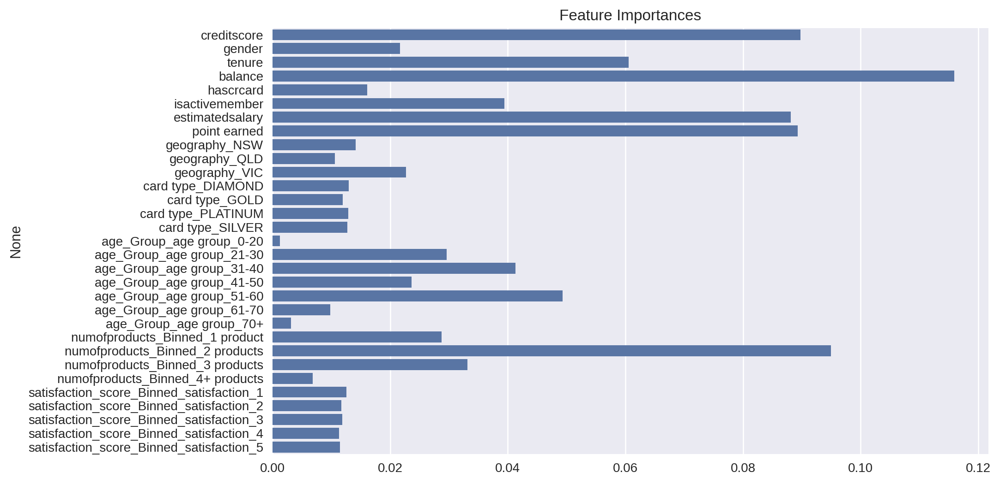

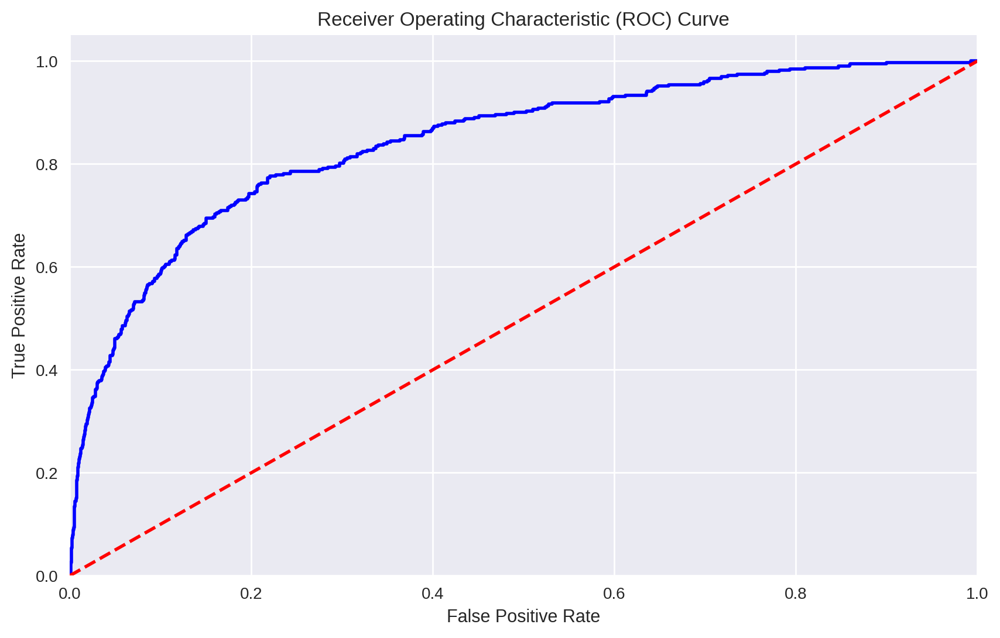

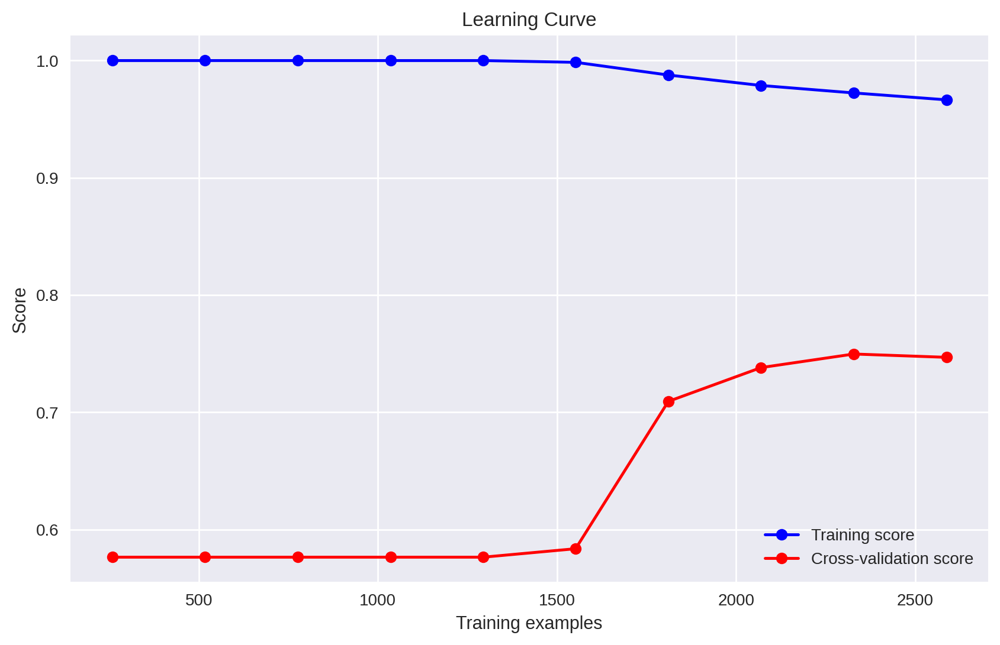

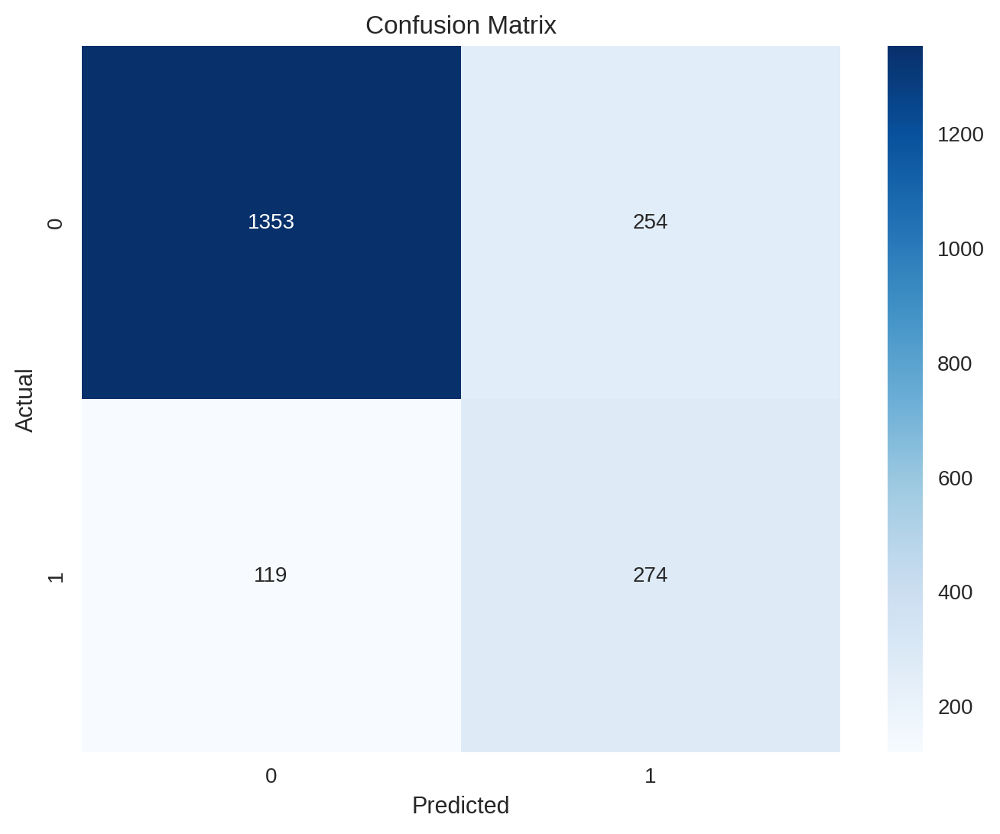

In [70]:
from sklearn.model_selection import GridSearchCV
from imblearn.under_sampling import CondensedNearestNeighbour
scaler = StandardScaler()
# Fit and transform the balance and estimated_salary fields
df[['balance', 'estimatedsalary']] = scaler.fit_transform(df[['balance', 'estimatedsalary']])
X = df.drop(['exited', 'complain','age','numofproducts','satisfaction score'], axis=1)
y = df['exited']
# Standardize the numerical features before splitting the data
#numerical_features = X.select_dtypes(include=[np.number]).columns.tolist()
#scaler = StandardScaler()
#X[numerical_features] = scaler.fit_transform(X[numerical_features])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

cnn_sample = CondensedNearestNeighbour(n_neighbors=1)
X_res, y_res = cnn_sample.fit_resample(X_train, y_train)
# Define the parameter grid
param_grid = {
    'n_estimators': [49],
    'max_depth': [None],
    'min_samples_split': [2],
    'min_samples_leaf': [2]
}

# Create a Random Forest Classifier with the parameter grid
rf_clf = RandomForestClassifier(class_weight='balanced', random_state=42)

# Instantiate the grid search model
grid_search = GridSearchCV(estimator=rf_clf, param_grid=param_grid, cv=3,n_jobs=-1, verbose=2)

# Fit the grid search to the data
grid_search.fit(X_res, y_res)

# Get the best parameters
best_params_rf = grid_search.best_params_

print(f'Best parameters for Random Forest: {best_params_rf}')

# Train the model with best parameters
best_grid = grid_search.best_estimator_
best_grid.fit(X_res, y_res)

# Predict the response for the test dataset
y_pred = best_grid.predict(X_test)

# Create a confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Print evaluation metrics
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))
print("Precision:", metrics.precision_score(y_test, y_pred))
print("Recall:", metrics.recall_score(y_test, y_pred))
print("F1 score:", metrics.f1_score(y_test, y_pred))
# Feature importance
feature_importances = best_grid.feature_importances_
features = X.columns

plt.figure(figsize=(10,6))
sns.barplot(x=feature_importances, y=features)
plt.title('Feature Importances')
plt.show()

# ROC/AUC curve
y_pred_proba = best_grid.predict_proba(X_test)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)

plt.figure(figsize=(10,6))
plt.plot(fpr, tpr, color='blue', lw=2)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.show()

print(f'ROC AUC: {roc_auc}')

# Learning curve
train_sizes, train_scores, test_scores = learning_curve(best_grid,
                                                        X_res, y_res,
                                                        cv=3,
                                                        n_jobs=-1,
                                                        train_sizes=np.linspace(0.1, 1.0, 10))

train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

plt.figure(figsize=(10,6))
plt.plot(train_sizes, train_scores_mean, 'o-', color='blue', label='Training score')
plt.plot(train_sizes, test_scores_mean, 'o-', color='red', label='Cross-validation score')
plt.xlabel('Training examples')
plt.ylabel('Score')
plt.title('Learning Curve')
plt.legend(loc='best')
plt.show()

# Confusion matrix visualization
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# CNN +GradientBoostingClassifier

[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=2, n_estimators=49; total time=   0.1s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=2, n_estimators=49; total time=   0.1s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=2, n_estimators=49; total time=   0.1s
Fitting 3 folds for each of 1 candidates, totalling 3 fits
Best parameters for GBM: {'learning_rate': 0.1, 'max_depth': 5, 'max_features': 'sqrt', 'min_samples_leaf': 10, 'min_samples_split': 2, 'n_estimators': 49, 'subsample': 0.9}
Accuracy: 0.8365
Precision: 0.569327731092437
Recall: 0.6895674300254453
F1 score: 0.6237054085155351
ROC AUC: 0.8553062223003367


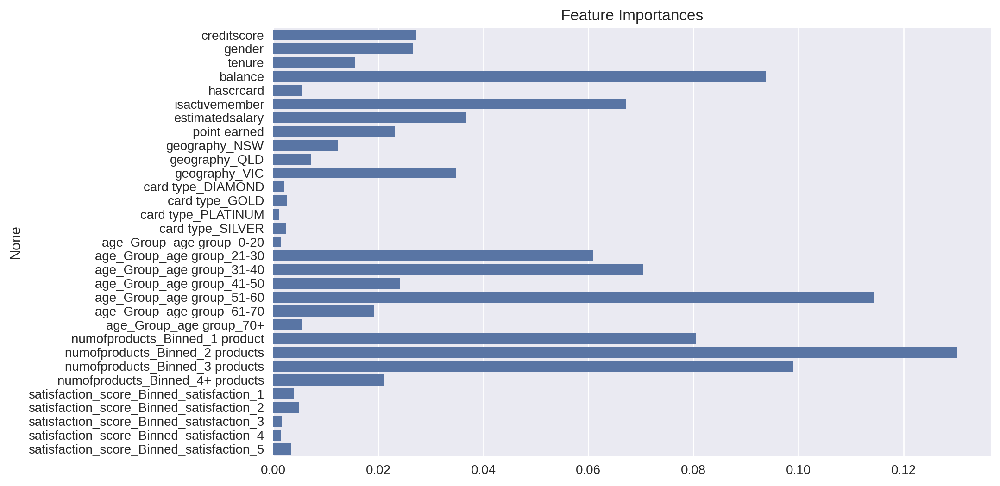

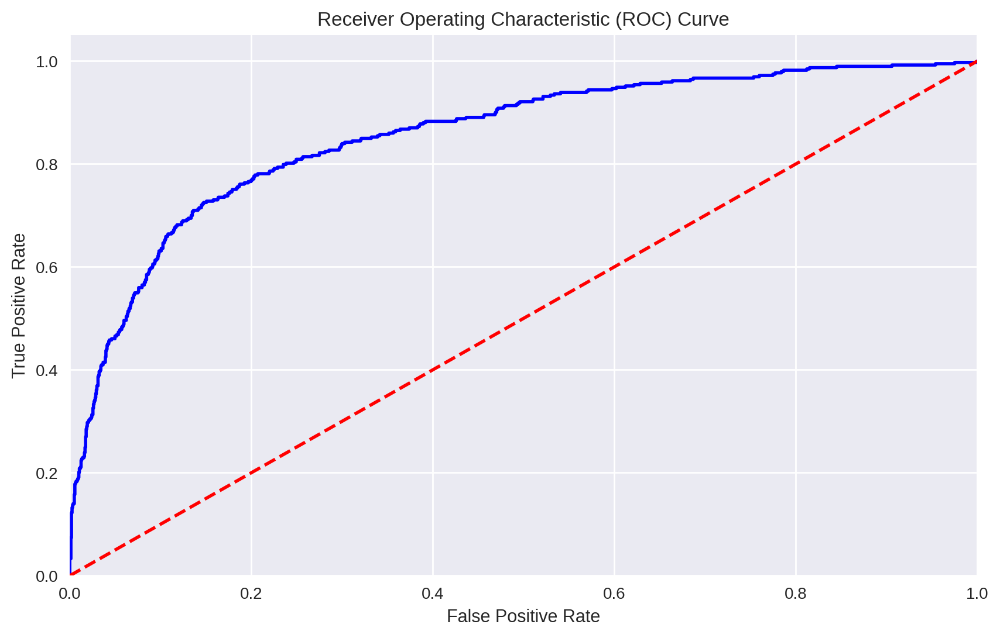

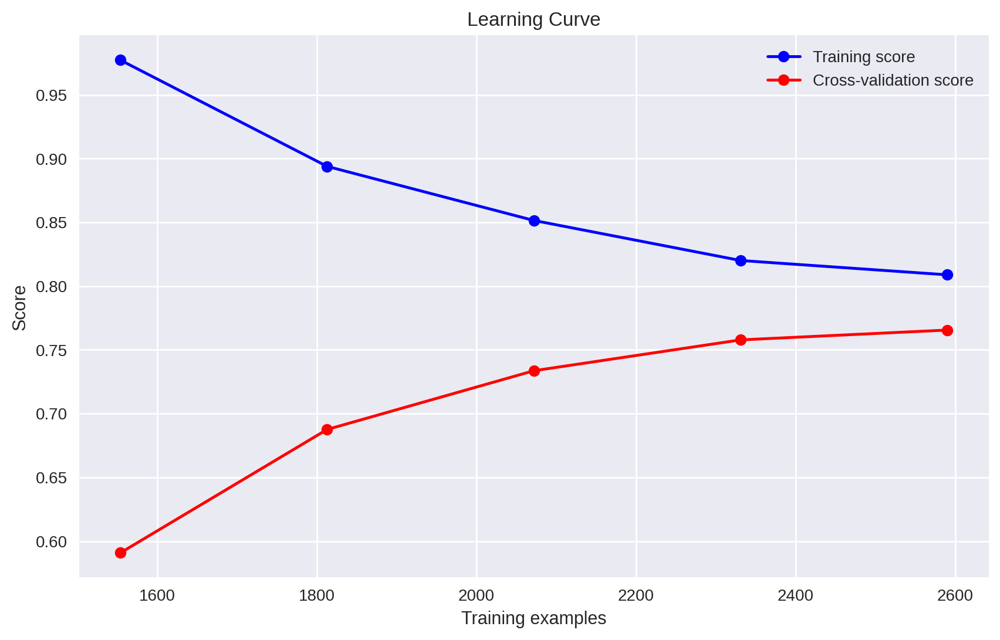

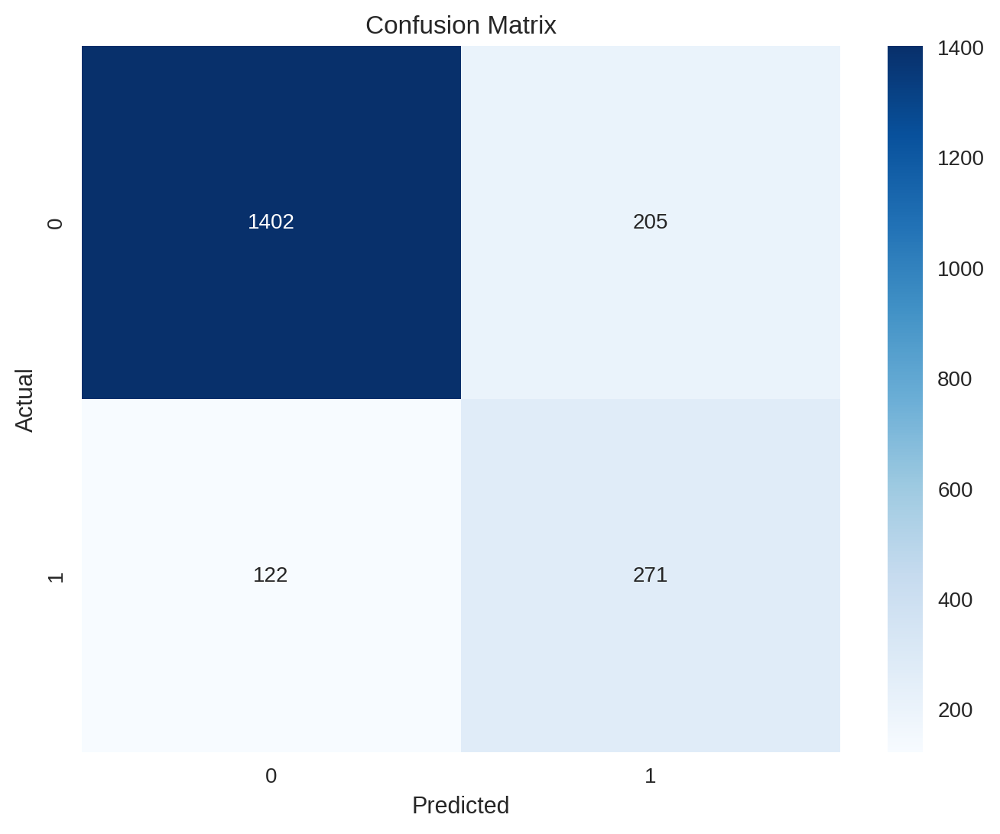

In [72]:
from sklearn.model_selection import GridSearchCV
from imblearn.under_sampling import CondensedNearestNeighbour
scaler = StandardScaler()
# Fit and transform the balance and estimated_salary fields
df[['balance', 'estimatedsalary']] = scaler.fit_transform(df[['balance', 'estimatedsalary']])
X = df.drop(['exited', 'complain','age','numofproducts','satisfaction score'], axis=1)
y = df['exited']
# Standardize the numerical features before splitting the data
#numerical_features = X.select_dtypes(include=[np.number]).columns.tolist()
#scaler = StandardScaler()
#X[numerical_features] = scaler.fit_transform(X[numerical_features])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

cnn_sample = CondensedNearestNeighbour(n_neighbors=1)
X_res, y_res = cnn_sample.fit_resample(X_train, y_train)
# Define the parameter grid
param_grid = {
    'n_estimators': [49],
    'learning_rate': [0.1],
       'max_depth': [5],
    'min_samples_split': [2],
    'min_samples_leaf': [10],
    'subsample': [0.9 ],
    'max_features': ['sqrt']

}

# Create a GBM Classifier with the parameter grid
gbm_clf = GradientBoostingClassifier(random_state=42)

# Instantiate the grid search model
grid_search = GridSearchCV(estimator=gbm_clf, param_grid=param_grid, cv=3,n_jobs=-1, verbose=2)

# Fit the grid search to the data
grid_search.fit(X_res, y_res)

# Get the best parameters
best_params_gbm = grid_search.best_params_

print(f'Best parameters for GBM: {best_params_gbm}')

# Train the model with best parameters
best_grid = grid_search.best_estimator_
best_grid.fit(X_res, y_res)

# Predict the response for the test dataset
y_pred = best_grid.predict(X_test)

# Create a confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Print evaluation metrics
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))
print("Precision:", metrics.precision_score(y_test, y_pred))
print("Recall:", metrics.recall_score(y_test, y_pred))
print("F1 score:", metrics.f1_score(y_test, y_pred))

# Feature importance
feature_importances = best_grid.feature_importances_
features = X.columns

plt.figure(figsize=(10,6))
sns.barplot(x=feature_importances, y=features)
plt.title('Feature Importances')
plt.show()

# ROC/AUC curve
y_pred_proba = best_grid.predict_proba(X_test)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)

plt.figure(figsize=(10,6))
plt.plot(fpr, tpr, color='blue', lw=2)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.show()

print(f'ROC AUC: {roc_auc}')

# Learning curve
train_sizes, train_scores, test_scores = learning_curve(best_grid,
                                                        X_res, y_res,
                                                        cv=3,
                                                        n_jobs=-1,
                                                        train_sizes=np.linspace(0.1, 1.0, 10))

train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

plt.figure(figsize=(10,6))
plt.plot(train_sizes, train_scores_mean, 'o-', color='blue', label='Training score')
plt.plot(train_sizes, test_scores_mean, 'o-', color='red', label='Cross-validation score')
plt.xlabel('Training examples')
plt.ylabel('Score')
plt.title('Learning Curve')
plt.legend(loc='best')
plt.show()

# Confusion matrix visualization
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# SMOTE +RandomForestClassifier

Fitting 3 folds for each of 1 candidates, totalling 3 fits
Best parameters for Random Forest: {'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}
Accuracy: 0.8485
Precision: 0.6323529411764706
Recall: 0.5470737913486005
F1 score: 0.5866302864938608
ROC AUC: 0.8503501696616742


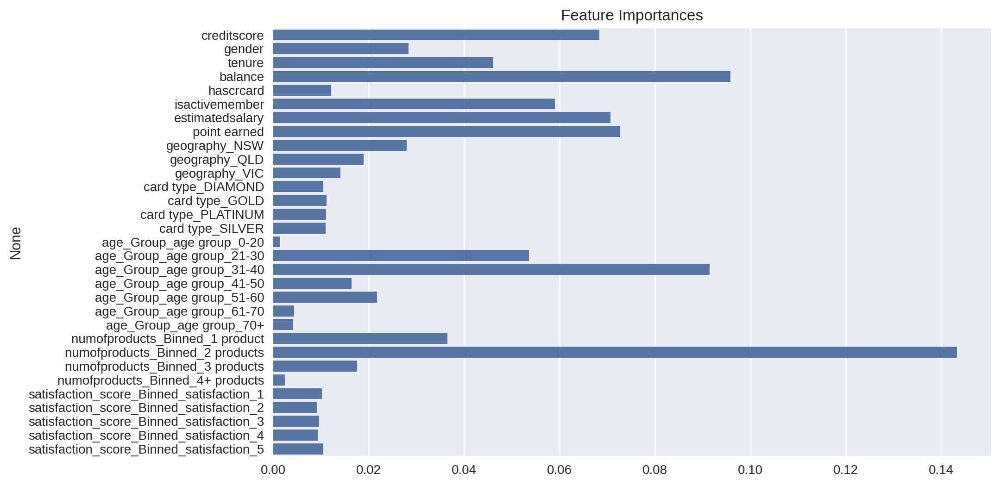

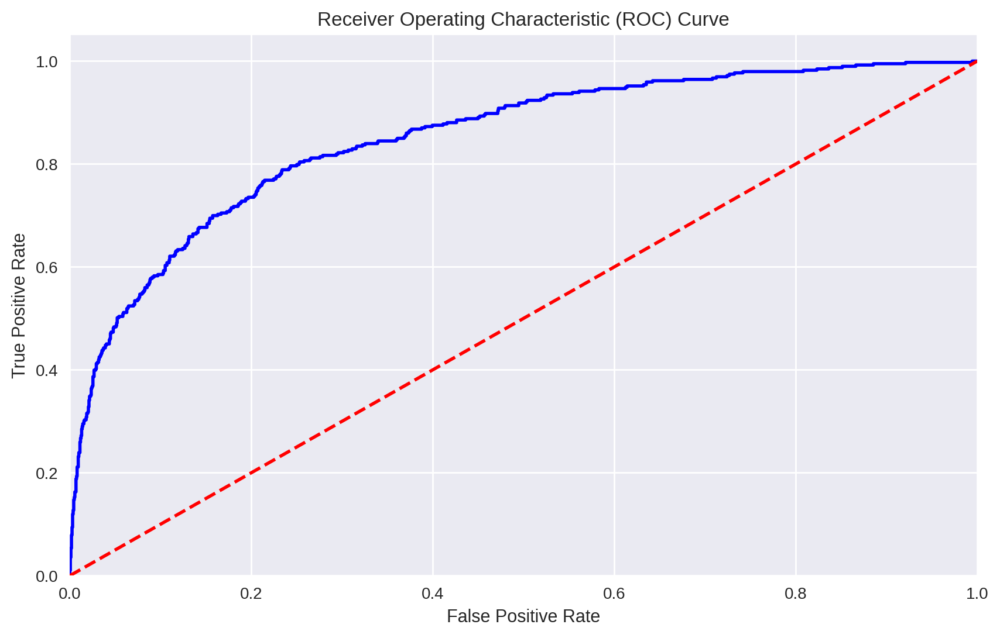

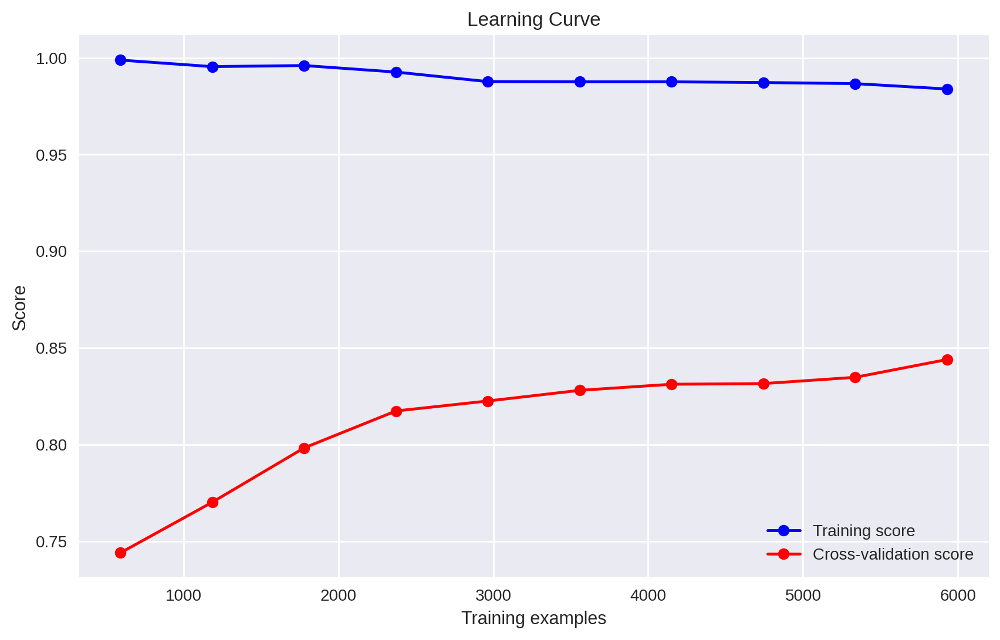

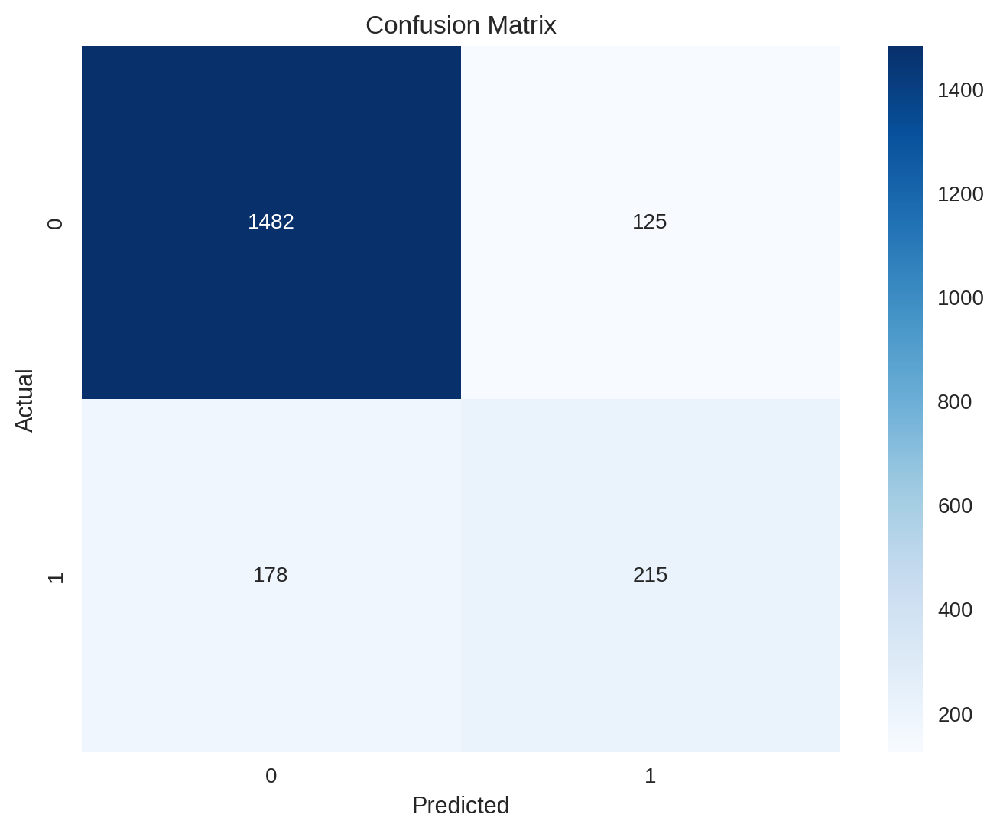

In [28]:
from sklearn.model_selection import GridSearchCV
from imblearn.over_sampling import SMOTE

scaler = StandardScaler()
# Fit and transform the balance and estimated_salary fields
df[['balance', 'estimatedsalary']] = scaler.fit_transform(df[['balance', 'estimatedsalary']])

X = df.drop(['exited', 'complain','age','numofproducts','satisfaction score'], axis=1)
y = df['exited']
# Standardize the numerical features before splitting the data
#numerical_features = X.select_dtypes(include=[np.number]).columns.tolist()
#scaler = StandardScaler()
#X[numerical_features] = scaler.fit_transform(X[numerical_features])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

smote_sample = SMOTE(sampling_strategy=0.4, k_neighbors=5, random_state=42)
X_res, y_res = smote_sample.fit_resample(X_train, y_train)
# Define the parameter grid
param_grid = {
    'n_estimators': [200],
    'max_depth': [None],
    'min_samples_split': [2],
    'min_samples_leaf': [2]
}

# Create a Random Forest Classifier with the parameter grid
rf_clf = RandomForestClassifier(class_weight='balanced', random_state=42)

# Instantiate the grid search model
grid_search = GridSearchCV(estimator=rf_clf, param_grid=param_grid, cv=3,n_jobs=-1, verbose=2)

# Fit the grid search to the data
grid_search.fit(X_res, y_res)

# Get the best parameters
best_params_rf = grid_search.best_params_

print(f'Best parameters for Random Forest: {best_params_rf}')

# Train the model with best parameters
best_grid = grid_search.best_estimator_
best_grid.fit(X_res, y_res)

# Predict the response for the test dataset
y_pred = best_grid.predict(X_test)

# Create a confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Print evaluation metrics
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))
print("Precision:", metrics.precision_score(y_test, y_pred))
print("Recall:", metrics.recall_score(y_test, y_pred))
print("F1 score:", metrics.f1_score(y_test, y_pred))
# Feature importance
feature_importances = best_grid.feature_importances_
features = X.columns

plt.figure(figsize=(10,6))
sns.barplot(x=feature_importances, y=features)
plt.title('Feature Importances')
plt.show()

# ROC/AUC curve
y_pred_proba = best_grid.predict_proba(X_test)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)

plt.figure(figsize=(10,6))
plt.plot(fpr, tpr, color='blue', lw=2)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.show()

print(f'ROC AUC: {roc_auc}')

# Learning curve
train_sizes, train_scores, test_scores = learning_curve(best_grid,
                                                        X_res, y_res,
                                                        cv=3,
                                                        n_jobs=-1,
                                                        train_sizes=np.linspace(0.1, 1.0, 10))

train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

plt.figure(figsize=(10,6))
plt.plot(train_sizes, train_scores_mean, 'o-', color='blue', label='Training score')
plt.plot(train_sizes, test_scores_mean, 'o-', color='red', label='Cross-validation score')
plt.xlabel('Training examples')
plt.ylabel('Score')
plt.title('Learning Curve')
plt.legend(loc='best')
plt.show()

# Confusion matrix visualization
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# SMOTE +GBM

Fitting 3 folds for each of 1 candidates, totalling 3 fits
Best parameters for GBM: {'learning_rate': 0.1, 'max_depth': 5, 'max_features': 'sqrt', 'min_samples_leaf': 10, 'min_samples_split': 2, 'n_estimators': 49, 'subsample': 0.9}
Accuracy: 0.8606666666666667
Precision: 0.7024390243902439
Recall: 0.4931506849315068
F1 score: 0.579476861167002
ROC AUC: 0.8497169271069581


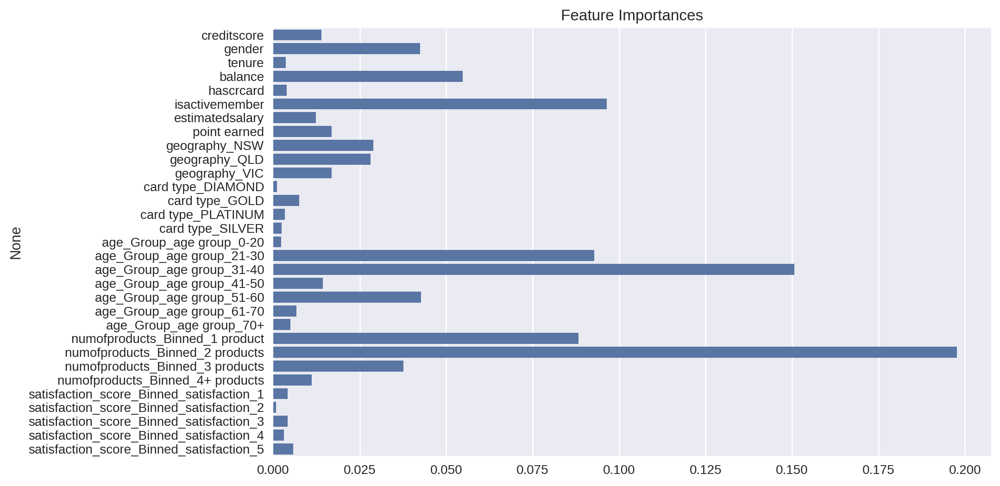

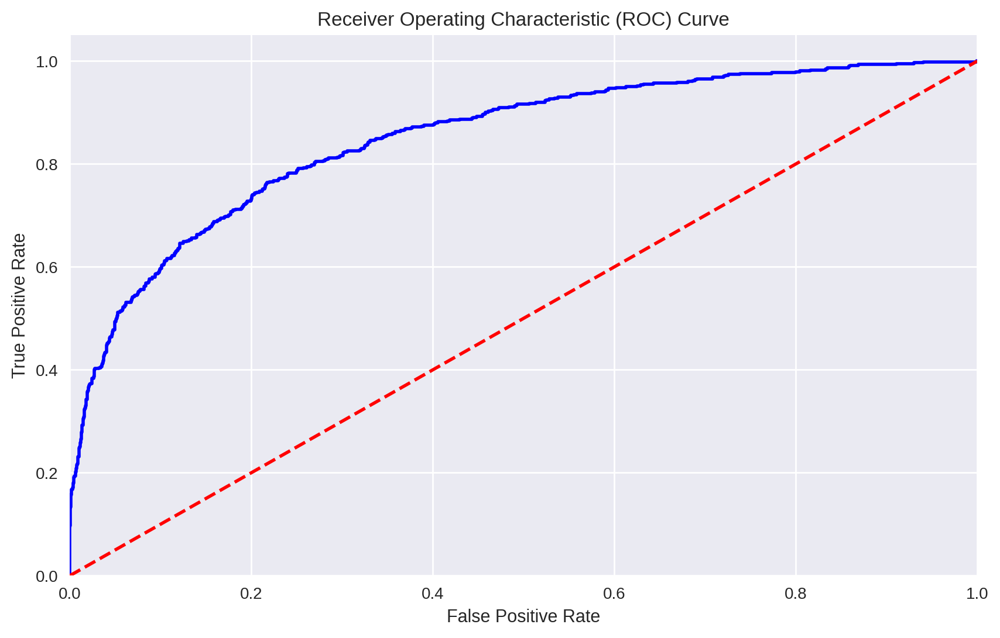

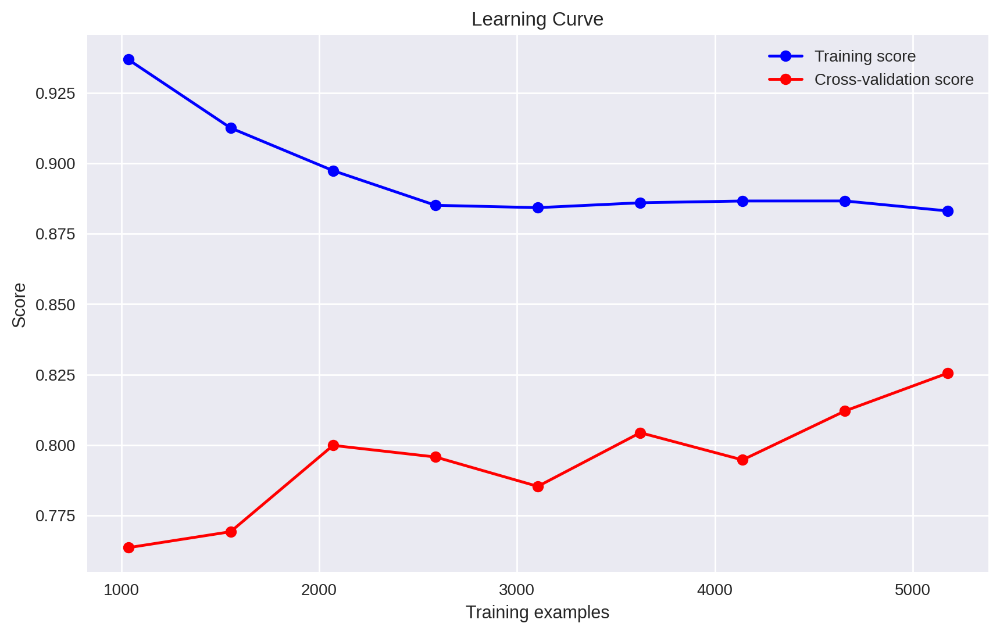

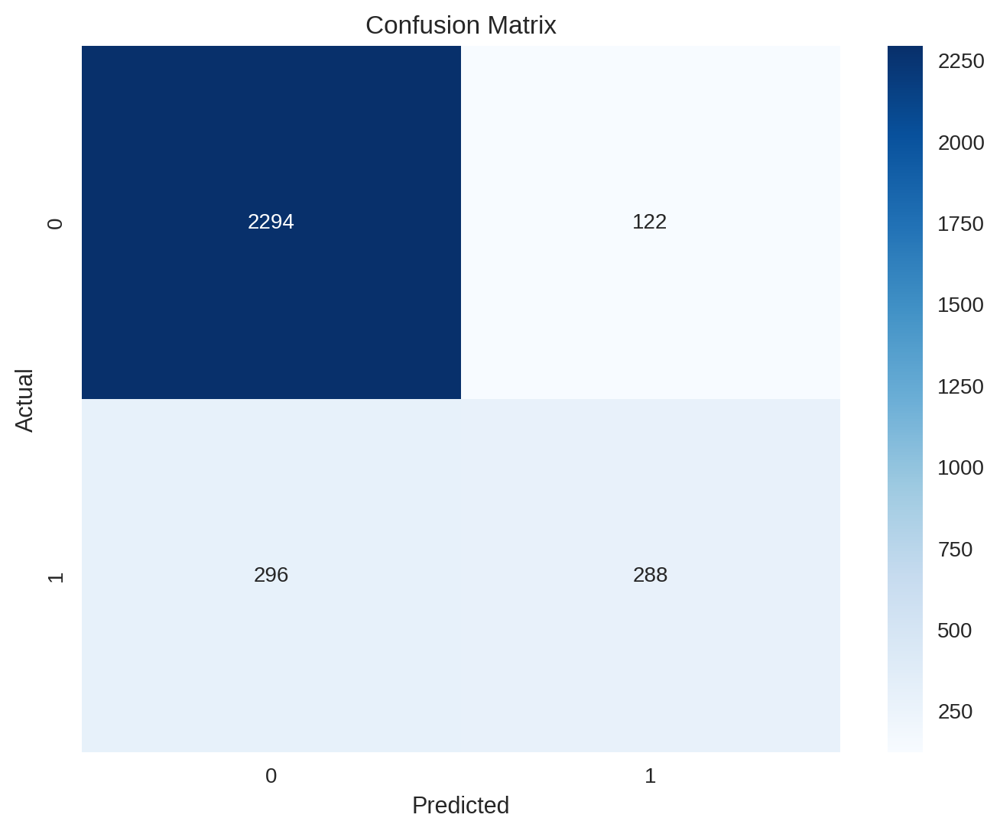

In [29]:
from sklearn.model_selection import GridSearchCV
from imblearn.over_sampling import SMOTE

scaler = StandardScaler()
# Fit and transform the balance and estimated_salary fields
df[['balance', 'estimatedsalary']] = scaler.fit_transform(df[['balance', 'estimatedsalary']])

X = df.drop(['exited', 'complain','age','numofproducts','satisfaction score'], axis=1)
y = df['exited']
# Standardize the numerical features before splitting the data
#numerical_features = X.select_dtypes(include=[np.number]).columns.tolist()
#scaler = StandardScaler()
#X[numerical_features] = scaler.fit_transform(X[numerical_features])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

smote_sample = SMOTE(sampling_strategy=0.4, k_neighbors=5, random_state=42)
X_res, y_res = smote_sample.fit_resample(X_train, y_train)
# Define the parameter grid
param_grid = {
    'n_estimators': [49],
    'learning_rate': [0.1],
       'max_depth': [5],
    'min_samples_split': [2],
    'min_samples_leaf': [10],
    'subsample': [0.9 ],
    'max_features': ['sqrt']

}

# Create a GBM Classifier with the parameter grid
gbm_clf = GradientBoostingClassifier(random_state=42)

# Instantiate the grid search model
grid_search = GridSearchCV(estimator=gbm_clf, param_grid=param_grid, cv=3,n_jobs=-1, verbose=2)

# Fit the grid search to the data
grid_search.fit(X_res, y_res)

# Get the best parameters
best_params_gbm = grid_search.best_params_

print(f'Best parameters for GBM: {best_params_gbm}')

# Train the model with best parameters
best_grid = grid_search.best_estimator_
best_grid.fit(X_res, y_res)

# Predict the response for the test dataset
y_pred = best_grid.predict(X_test)

# Create a confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Print evaluation metrics
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))
print("Precision:", metrics.precision_score(y_test, y_pred))
print("Recall:", metrics.recall_score(y_test, y_pred))
print("F1 score:", metrics.f1_score(y_test, y_pred))

# Feature importance
feature_importances = best_grid.feature_importances_
features = X.columns

plt.figure(figsize=(10,6))
sns.barplot(x=feature_importances, y=features)
plt.title('Feature Importances')
plt.show()

# ROC/AUC curve
y_pred_proba = best_grid.predict_proba(X_test)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)

plt.figure(figsize=(10,6))
plt.plot(fpr, tpr, color='blue', lw=2)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.show()

print(f'ROC AUC: {roc_auc}')

# Learning curve
train_sizes, train_scores, test_scores = learning_curve(best_grid,
                                                        X_res, y_res,
                                                        cv=3,
                                                        n_jobs=-1,
                                                        train_sizes=np.linspace(0.1, 1.0, 10))

train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

plt.figure(figsize=(10,6))
plt.plot(train_sizes, train_scores_mean, 'o-', color='blue', label='Training score')
plt.plot(train_sizes, test_scores_mean, 'o-', color='red', label='Cross-validation score')
plt.xlabel('Training examples')
plt.ylabel('Score')
plt.title('Learning Curve')
plt.legend(loc='best')
plt.show()

# Confusion matrix visualization
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()